In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import re
import seaborn as sns



# Be - bestanden
## alle parts en items over de gehele tijd en alle linacs

In [2]:
linac2_headers = pd.read_csv("data/calblocks_update_table_cal_headers.csv", names=["date", "file_name", "empty", "thiing", "thing"])
linac2_items = pd.read_csv("data/calblocks_update_table_cal_items.csv",  names=["item", "category", "thing", "thiing"])
linac2_values = pd.read_csv("data/calblocks_update_table_cal_values.csv", names=["id", "calheaders_id", "item", "part", "value"])

linac2_headers.reset_index(inplace=True)
linac2_headers.set_index("level_0", inplace=True)
linac2_headers['datum'] = linac2_headers['date'].str.replace('/', '-', regex=False)

linac2_headers['date'] = pd.to_datetime(linac2_headers['date'], format='%d/%m/%Y')
linac2_headers["date"] = linac2_headers["date"].astype("str")

linac2_headers.columns = ["linac","date", "file_name", "empty", "thiing", "thing", "datum"]

BE5201 file: Low X-ray energy - 6 MV

In [3]:
tempdf = linac2_headers[["linac", "date", "file_name"]].merge(linac2_values[["calheaders_id", "item", "part", "value"]] ,left_on="level_0", right_on="calheaders_id", how="inner").drop(columns="calheaders_id")
merged_df = tempdf.merge(linac2_items[["item", "category"]], on = "item", how="inner")


merged_df = merged_df[merged_df["linac"] != 7460]

be5201 = merged_df[merged_df["file_name"] == "Be5201"].copy()
be5201["Part&item"] = "I:"+ be5201["item"].astype(str) + " P:"+ be5201["part"].astype(str)


geen part 45 en niet veranderende elementen

In [4]:
nop45 = be5201[be5201["part"] != 45]

for linac in list(set(nop45["linac"])):
    result = pd.DataFrame()

    linec_df = nop45[nop45["linac"] == linac]
    dates = list(set(linec_df["date"]))

    for item in range(len(dates)-1):
        old = linec_df[linec_df["date"] == dates[item]]
        new = linec_df[linec_df["date"] == dates[item+1]]

        diff = new["value"].values - old["value"].values
        temp = pd.DataFrame({
            "date": new["date"].tolist(),
            "difference": diff,
            "PI": new["Part&item"],
            "linac": new["linac"]
        })

        result = pd.concat([temp, result])
        

changed = result[result["difference"] != 0]

changes = changed["PI"].unique().tolist()

2983
2325
2638
2191


item                               44                                314  \
part                             141.0                             1.0     
category Monitored dose rate channel 1 Set dosimetry channel 1 reference   
count                            10.00                             10.00   
mean                            597.00                           1980.00   
std                               0.00                              6.32   
min                             597.00                           1978.00   
25%                             597.00                           1978.00   
50%                             597.00                           1978.00   
75%                             597.00                           1978.00   
max                             597.00                           1998.00   
count                            15.00                             15.00   
mean                            605.07                           2008.87   
std                               2.43                             22.65   
min                             600.00                           1927.00   
25%                             605.00                           2014.00   
50%                             605.00                           2015.00   
75%                             605.00                           2015.00   
max                             610.00                           2015.00   
count                            15.00                             15.00   
mean                            613.80                           1973.73   
std                               5.41                             33.79   
min                             609.00                           1927.00   
25%                             609.00                           1939.00   
50%                             612.00                           1996.00   
75%                             621.00                           1996.00   
max                             621.00                           2008.00   
count                            23.00                             23.00   
mean                            638.96                           2038.30   
std                              13.97                             15.19   
min                             628.00                           2014.00   
25%                             628.00                           2027.50   
50%                             628.00                           2039.00   
75%                             656.00                           2049.00   
max                             656.00                           2063.00   

item                                   315                           44   \
part                                 1.0                           134.0   
category Set dosimetry channel 2 reference Monitored dose rate channel 1   
count                                10.00                         10.00   
mean                               1721.20                        480.00   
std                                   6.96                          0.00   
min                                1719.00                        480.00   
25%                                1719.00                        480.00   
50%                                1719.00                        480.00   
75%                                1719.00                        480.00   
max                                1741.00                        480.00   
count                                15.00                         15.00   
mean                               1785.33                        410.60   
std                                  17.90                         11.96   
min                                1780.00                        403.00   
25%                                1780.50                        403.00   
50%                                1781.00                        403.00   
75%                                1781.00     

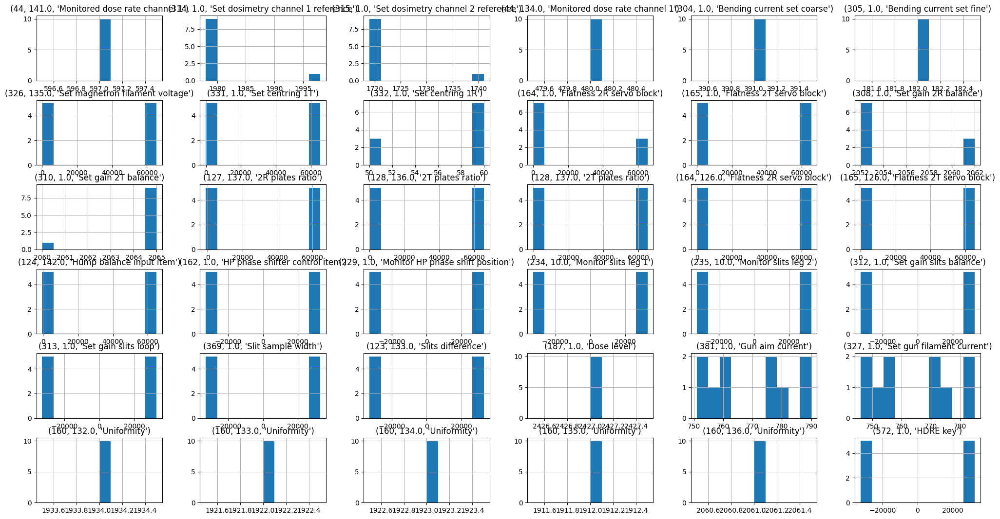

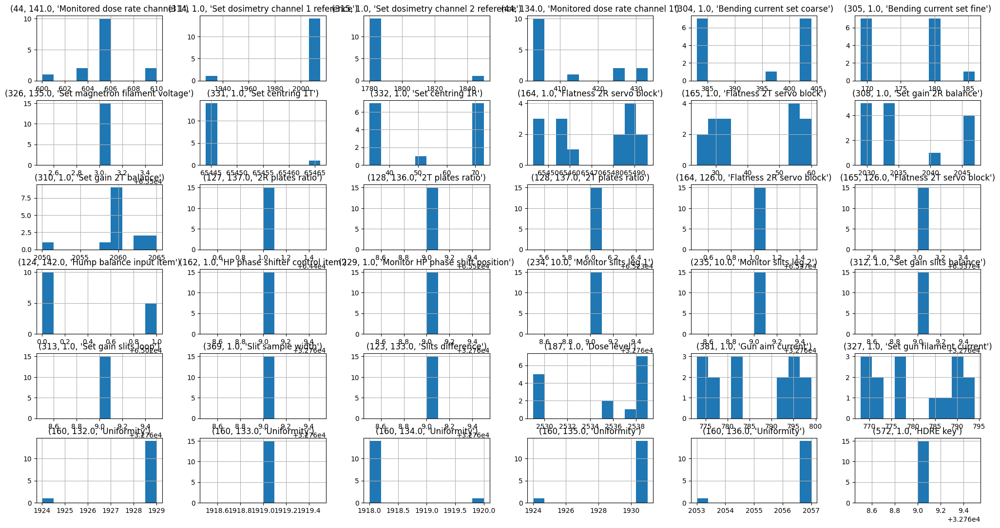

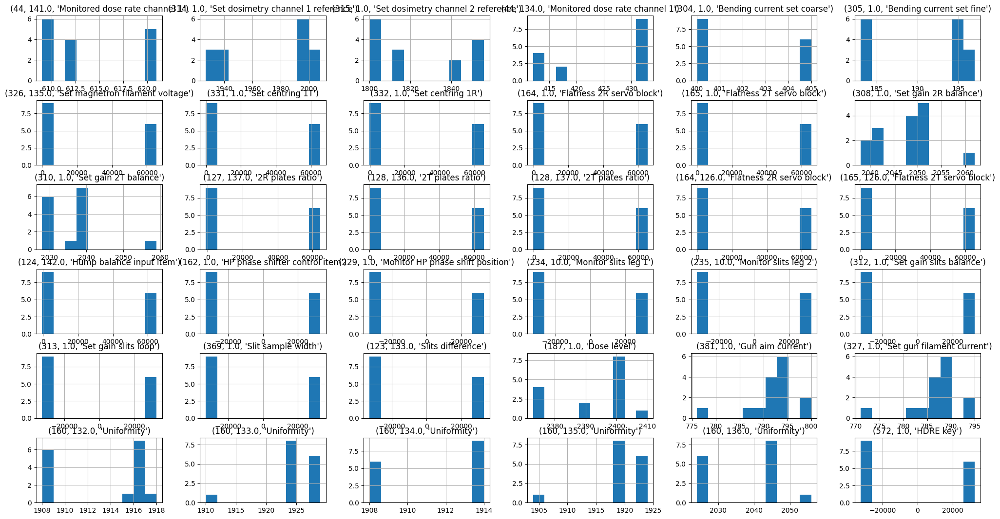

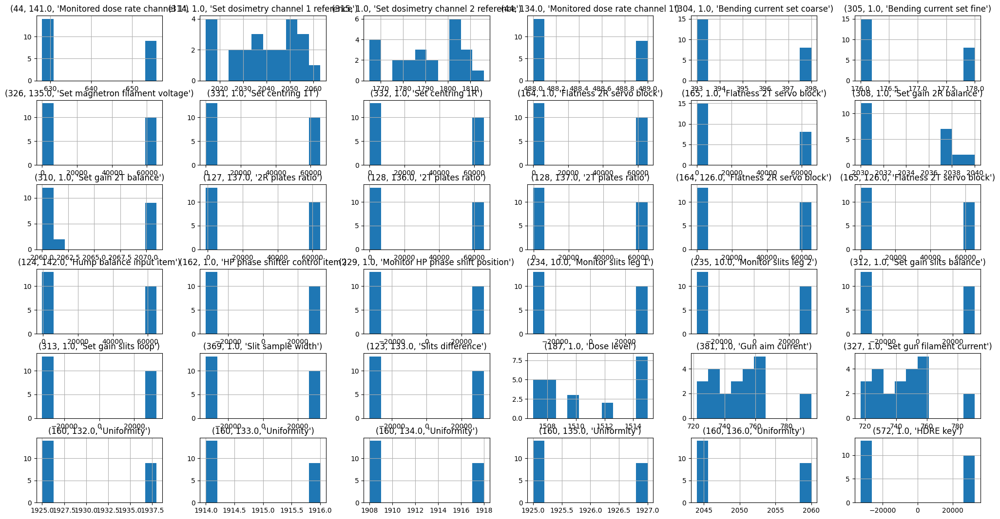

In [5]:
#only the changed combination of part and item
changes_df = be5201[be5201["Part&item"].isin(changes)]

show = pd.DataFrame()

# for every linac the describe of the same data
for linac in list(set(changes_df["linac"])):
    print(linac)
    pivoted = changes_df[changes_df["linac"] == linac].pivot(index="date", columns=["item", "part", "category"], values="value")
    describing = pivoted.describe()
    show = pd.concat([show, describing])
    pivoted.hist(figsize=(25,13));

    

show.round(2)

De meeste datapunten zijn geproduceerd bij linac 2191, dit kan het meest informatie bevatten. En is dus het meest interresant om op te focussen. De range van de data verschilt heel veel per part en item.

Ook veranderd niet elke part en item bij alle linacs, elke linac heeft uiteraard zijn eigen problemen. En bepaalde aanpassingen voor het goede energie niveau zijn dan nodig. Maar dat er een groot verschil kan zitten, zichtbaar in Flatness 2T servo block. Is best merkwaardig.

### Vergelijken BE bestanden


C:\Users\Laris\AppData\Local\Temp\ipykernel_15552\1089088569.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  be5201["Part&item"] = "I:"+ be5201["item"].astype(str) + " P:"+ be5201["part"].astype(str)


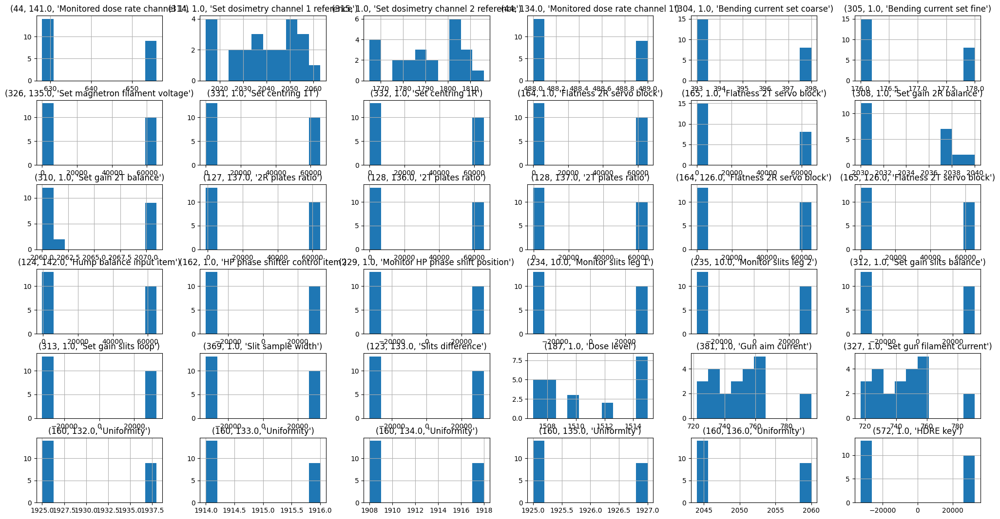

In [6]:
be5201 = merged_df[merged_df["file_name"] == "Be5201"]
be5201["Part&item"] = "I:"+ be5201["item"].astype(str) + " P:"+ be5201["part"].astype(str)

changes_df = be5201[be5201["Part&item"].isin(changes)]


pivoted = changes_df[changes_df["linac"] == 2191].pivot(index="date", columns=["item", "part", "category"], values="value")

pivoted.hist(figsize=(25,13));

C:\Users\Laris\AppData\Local\Temp\ipykernel_15552\663203575.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  be5205["Part&item"] = "I:"+ be5205["item"].astype(str) + " P:"+ be5205["part"].astype(str)


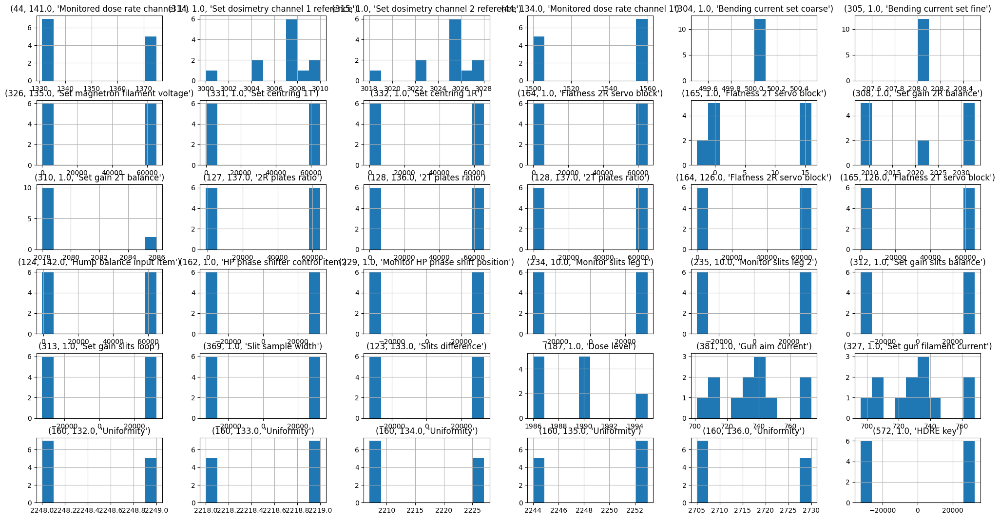

In [7]:
be5205 = merged_df[merged_df["file_name"] == "Be5205"]
be5205["Part&item"] = "I:"+ be5205["item"].astype(str) + " P:"+ be5205["part"].astype(str)

changes_df = be5205[be5205["Part&item"].isin(changes)]


pivoted_05 = changes_df[changes_df["linac"] == 2191].pivot(index=["date","linac"], columns=["item", "part", "category"], values="value")

pivoted_05.hist(figsize=(25,13));

Bij een ander energie niveau, zijn niet de zelfde verandering in de items aanwezig. Zelfs de zelfde items worden niet veranderd. Meerdere items, zijn 1x veranderd, of zijn in deze linac niet veranderd. Ook zijn er geen standaard verdeling aanwezig.

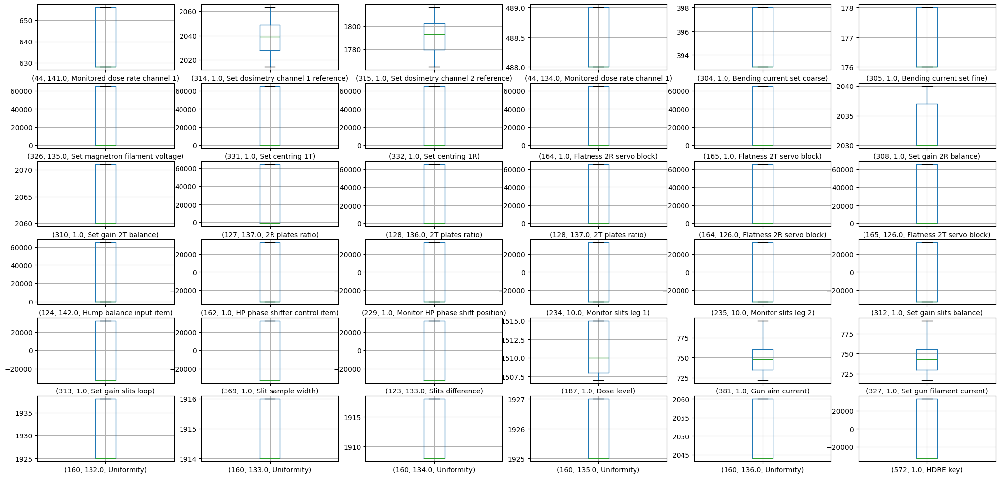

In [8]:
fig, axes = plt.subplots(nrows=6, ncols=6, figsize=(25, 12));
for num in range(len(pivoted.columns)):
    row, col = divmod(num, 6)
    pivoted.iloc[:, num: num+1].boxplot(ax=axes[row, col])

Door de kleine dataset zijn er niet veel outliers aanwezig. Alleen bij item 314 en 315 is een outlier aanwezig.

In [9]:

linac3_01 = be5201[be5201["linac"] == 2191].sort_values(by="date")


px.line(linac3_01[linac3_01["item"].isin([314, 315])], x="date", y ="value", color="item" , hover_data="date", markers=True)

Als de outlier dichterbij wordt bekeken, is dit de meest recente punt van maart 12 2025. Deze items wordden geffecteerd door de druk en temperatuur. 

In [10]:
# Filter relevant data
changes_df = be5201[be5201["Part&item"].isin(changes)]


# Pivot the dataframe
pivoted = changes_df.pivot(index=["date", "linac"], columns=["item", "part", "category"], values="value").reset_index()

# Flatten column names
pivoted.columns = [
    '_'.join(map(str, col)).strip() if isinstance(col, tuple) else col
    for col in pivoted.columns
]

# Rename the incorrectly flattened date/linac columns
pivoted = pivoted.rename(columns={"date__": "date", "linac__": "linac"})

# Select value columns for plotting
value_cols = [col for col in pivoted.columns if col not in ['date', 'linac']]

# Plot with seaborn
sns.pairplot(pivoted, hue="linac", vars=value_cols, plot_kws={'alpha': 0.1});


Hier is nu ook heel goed zichtbaar dat niet alle elementen bij elke linac veranderd worden. Er zijn geen directe clusters te herkennen of dat waarden in bepaalde ranges blijft. Dit is afhankelijk per linac. Hierdoor moet een model getrained worden per linac.

Deze onderstaande lijnen zijn meerdere veranderingen ondergaan

In [11]:
df_2191 = changes_df[changes_df["linac"] == 2191]

px.line(df_2191[df_2191["category"].isin(["Set dosimetry channel 1 reference", "Set dosimetry channel d reference",
                               "Gun aim current", "Dose level", "Set gun filament current"])], x="date", y="value", color="Part&item")

## Item 187, Dose level

In [12]:

be5201 = be5201.sort_values(by=['date', 'linac'])

px.line(be5201[be5201["item"] == 187], x="date", y ="value", color="linac", hover_data="category", markers=True)

### Outliers

In [13]:
def det_outliers(all):
    total = pd.DataFrame()
    for linac in all["linac"].unique():
        df = all[all["linac"] == linac].copy()  

        # Calculate Moving Averages
        df['SMA'] = df["value"].rolling(window=3).mean()

        # Calculate residuals (deviation from SMA)
        df['residual'] = df['value'] - df['SMA']

        # Rolling standard deviation of residuals
        df['rolling_std'] = df['residual'].rolling(window=6).std()

        # Identify outliers using a threshold (k = 2)
        k = 2
        df['is_outlier'] = np.abs(df['residual']) > (k * df['rolling_std'])

        # Collect outliers
        outliers = df[df['is_outlier']]
        total = pd.concat([total, outliers])
        
    return total


In [14]:
outliers = det_outliers(be5201[be5201["item"] == 187])

fig = px.line(be5201[be5201["item"] == 187], x="date", y ="value", color="linac", hover_data="date", markers=True)

fig.add_scatter(x=outliers['date'],
                y=outliers['value'],
                mode="markers",
                marker=dict(
                    color='black',
                    size=5
                ),
               name='outliers')

## item 314, set dosismetry channel 1 reference

In [15]:
outliers = det_outliers(be5201[be5201["item"] == 314])

fig = px.line(be5201[be5201["item"] == 314], x="date", y ="value", color="linac", hover_data="date", markers=True)

fig.add_scatter(x=outliers['date'],
                y=outliers['value'],
                mode="markers",
                marker=dict(
                    color='black',
                    size=5
                ),
               name='outliers')

## Item 315, set dosismetry channel 2 reference

In [16]:
outliers = det_outliers(be5201[be5201["item"] == 315])

fig = px.line(be5201[be5201["item"] == 315], x="date", y ="value", color="linac", hover_data="date", markers=True)

fig.add_scatter(x=outliers['date'],
                y=outliers['value'],
                mode="markers",
                marker=dict(
                    color='black',
                    size=5
                ),
               name='outliers')

## Item 327, set gun filament current

Part 1 en 45 zijn de enige die veranderen en 1 heeft echt waarde, maar part 195: EBS mode en part 19,125,126,131,132,141,143,144,157, 172 worden ook gebruikt.

In [17]:
i_327 = be5201[be5201["item"] == 327]
px.line(i_327[i_327["part"].isin([19,125,126,131,132,141,143,144,157, 172, 195])], x="date", y ="value", color="part", symbol= "linac",hover_data="item", markers=True)


Zijn allemaal de zelfde waarde, dus geen effect op veranderingen.

## Outliers

In [18]:
outliers = det_outliers(be5201[be5201["Part&item"] == "I:327 P:1"])

fig = px.line(be5201[be5201["Part&item"] == "I:327 P:1"], x="date", y ="value", color="linac", hover_data="date", markers=True)

fig.add_scatter(x=outliers['date'],
                y=outliers['value'],
                mode="markers",
                marker=dict(
                    color='black',
                    size=5
                ),
               name='outliers')

KeyError: 'date'

## Item 381, gun aim current

Dit is een interessant element voor het onderhouden van het filament. 

### outliers

Dit kunnen ingestelde waarden zijn die buiten de verwachtingen kunnen vallen wat normale afnamen van apparatuur moet zijn. 

In [ ]:
outliers = det_outliers(be5201[be5201["item"] == 381])

fig = px.line(be5201[be5201["item"] == 381], x="date", y ="value", color="linac", hover_data="date", markers=True)

fig.add_scatter(x=outliers['date'],
                y=outliers['value'],
                mode="markers",
                marker=dict(
                    color='black',
                    size=5
                ),
               name='outliers')

## Correlation

Zijn er verbanden tussen deze veranderende items.

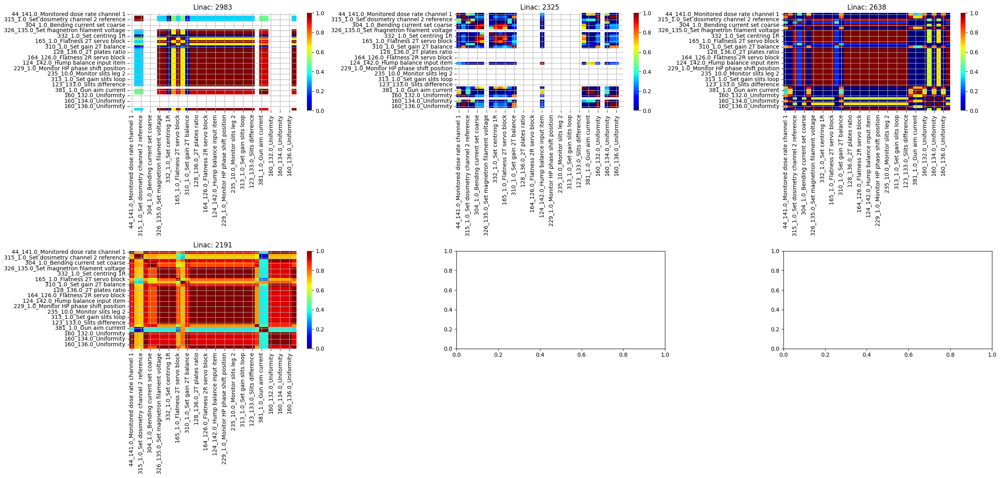

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=3, figsize=(25, 12))
linacs = list(set(pivoted["linac"]))

for num in range(len(linacs)):
    row, col = divmod(num, 3)
    corr = pivoted[pivoted["linac"] == linacs[num]].set_index(["date", "linac"]).corr()
    sns.heatmap(corr, cmap="jet", vmin=0.0, vmax=1.0, ax=axes[row, col], )
    axes[row, col].set_title(f"Linac: {linacs[num]}")
    axes[row, col].grid(True)

plt.tight_layout()
plt.show()


De items die in 1 linac een verband hebben, is dit verband in de volgende linac compleet anders.

In [ ]:
pivoted_05 = changes_df.pivot(index=["date","linac"], columns=["item", "part", "category"], values="value")


# Flatten column names
pivoted_05.columns = [
    '_'.join(map(str, col)).strip() if isinstance(col, tuple) else col
    for col in pivoted_05.columns
]

# Rename the incorrectly flattened date/linac columns
pivoted_05 = pivoted_05.rename(columns={"date__": "date", "linac__": "linac"})

pivoted_05 = pivoted_05.reset_index()


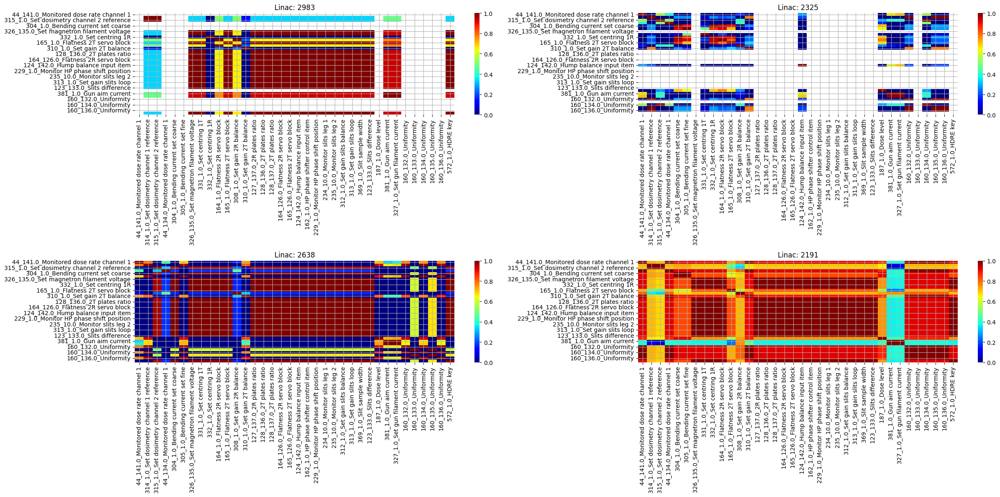

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(25, 12))
linacs = list(set(pivoted_05["linac"]))

for num in range(len(linacs)):
    row, col = divmod(num, 2)
    corr = pivoted_05[pivoted_05["linac"] == linacs[num]].set_index(["date", "linac"]).corr()
    sns.heatmap(corr, cmap="jet", vmin=0.0, vmax=1.0, ax=axes[row, col], )
    axes[row, col].set_title(f"Linac: {linacs[num]}")
    axes[row, col].grid(True)

plt.tight_layout()
plt.show()


De matrixen zijn in een snel overzicht redelijke het zelfde.

### Het model

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.svm import SVR
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.linear_model import BayesianRidge
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import LassoLars
from sklearn.model_selection import cross_validate
from sklearn.feature_selection import SelectKBest


In [ ]:
df_ml = pivoted[pivoted["linac"] == 2191].set_index(["date", "linac"])

df_ml = df_ml.drop("2025-04-30")

y = df_ml["381_1.0_Gun aim current"]
X = df_ml.drop("381_1.0_Gun aim current", axis=1)

X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.33, random_state=42)
	

In [ ]:
models= [
    LinearRegression,
    RandomForestRegressor,
    SVR,
    GaussianProcessRegressor,
    BayesianRidge,
    LassoLars
]

metric_scores = {}
for model in models:
    scores = cross_validate(model(), X, y, return_train_score=True)
    for key, val in scores.items():
        scores[key] = val.mean()
    metric_scores[f"{model.__name__}"] = scores
    
pd.DataFrame(metric_scores).T

c:\Users\Laris\miniconda3\envs\stage\Lib\site-packages\sklearn\linear_model\_least_angle.py:723: ConvergenceWarning:

Regressors in active set degenerate. Dropping a regressor, after 1 iterations, i.e. alpha=2.670e+04, with an active set of 1 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.

c:\Users\Laris\miniconda3\envs\stage\Lib\site-packages\sklearn\linear_model\_least_angle.py:723: ConvergenceWarning:

Regressors in active set degenerate. Dropping a regressor, after 2 iterations, i.e. alpha=1.335e+04, with an active set of 2 regressors, and the smallest cholesky pivot element being 2.220e-16. Reduce max_iter or increase eps parameters.

c:\Users\Laris\miniconda3\envs\stage\Lib\site-packages\sklearn\linear_model\_least_angle.py:723: ConvergenceWarning:

Regressors in active set degenerate. Dropping a regressor, after 5 iterations, i.e. alpha=1.334e+04, with an active set of 3 regressors, and the smallest cholesky pivot

,fit_time,score_time,test_score,train_score
LinearRegression,0.011261,0.004115,-2.648871e+00,9.998959e-01
RandomForestRegressor,0.226039,0.019164,-3.310949e+00,9.418339e-01
SVR,0.006148,0.003212,-4.590103e+01,2.160595e-01
GaussianProcessRegressor,0.008601,0.003701,-1.651058e+05,1.000000e+00
BayesianRidge,0.009340,0.003881,8.348284e-01,9.998849e-01
LassoLars,0.013338,0.003734,-2.848434e+18,-1.023164e+06


In [ ]:
metric_scores = {}
k = 22
while k:
    X_select = SelectKBest(k=k).fit_transform(X, y)
    scores = cross_validate(BayesianRidge(), X_select, y, return_train_score=True)
    for key, val in scores.items():
        scores[key] = val.mean()
    metric_scores[f"{k} features"] = scores
    k -= 1

kbest = pd.DataFrame(metric_scores).T


c:\Users\Laris\miniconda3\envs\stage\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

c:\Users\Laris\miniconda3\envs\stage\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

c:\Users\Laris\miniconda3\envs\stage\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

c:\Users\Laris\miniconda3\envs\stage\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

c:\Users\Laris\miniconda3\envs\stage\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

c:\Users\Laris\miniconda3\envs\stage\Lib\site-packages\sklearn\feature_selection\_univariate_selection.py:112: RuntimeWarning:

divide by zero encountered in divide

c:\U

In [ ]:
kbest[kbest["test_score"] > 0.90].sort_values(by="test_score", ascending=False)

,fit_time,score_time,test_score,train_score
6 features,0.002817,0.001410,0.974381,0.999680
7 features,0.003592,0.001564,0.972828,0.999698
9 features,0.003130,0.001517,0.972618,0.999731
8 features,0.003147,0.001342,0.968119,0.999724
10 features,0.002892,0.001394,0.956073,0.999740
21 features,0.002865,0.001282,0.908157,0.999754
22 features,0.003398,0.001740,0.908157,0.999754
17 features,0.003531,0.001547,0.908156,0.999754
18 features,0.003712,0.001745,0.908156,0.999754
14 features,0.002721,0.001539,0.908156,0.999754


In [ ]:
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.metrics import r2_score, mean_squared_error

best_k = 9
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, random_state=42)

# SelectKBest 
selector = SelectKBest(score_func=f_regression, k=best_k)
X_train_selected = selector.fit_transform(X_train, y_train)
X_test_selected = selector.transform(X_test)

# Model trainen
model = BayesianRidge()
model.fit(X_train_selected, y_train)

y_pred = model.predict(X_test_selected)

# Evaluatie
print("R²-score:", r2_score(y_test, y_pred))
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
print("RMSE:", rmse)


R²-score: 0.9993236015339455
RMSE: 0.3631190245311982


Het is wel heel accuraat, het lijkt alsof het overfit.

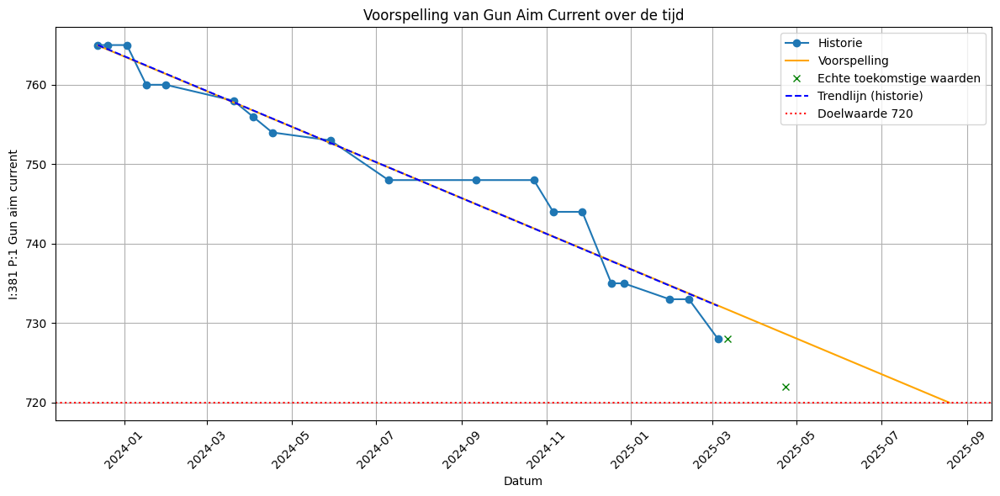

In [ ]:
# Filter en sorteer de data
df = pivoted[pivoted["linac"] == 2191].copy()
df = df.set_index("date").sort_index()
df = df.drop(["2025-04-30", "2025-05-14"])
df.index = pd.to_datetime(df.index)

# future dates
true_dates = [ "2025-03-12", "2025-04-23"]
true_future = df.loc[true_dates]
y_true = true_future["381_1.0_Gun aim current"]

# remove future dates
df = df.drop(true_dates)
y = df["381_1.0_Gun aim current"]

# changes dates to amount of days
start_date = y.index.min()
X = (y.index - start_date).days.values.reshape(-1, 1)

# Train model
model = BayesianRidge()
model.fit(X, y)

# predict
future_steps = 0
y_future_pred = pd.Series([800])
while y_future_pred.min() > 720:
    future_steps += 1
    future_dates = pd.date_range(start=y.index[-1] + pd.Timedelta(days=1), periods=future_steps)
    X_future = (future_dates - start_date).days.values.reshape(-1, 1)
    y_future_pred = model.predict(X_future)


# combine future dates to get full prediction
all_dates = y.index.tolist() + future_dates.tolist()
X_all = (pd.to_datetime(all_dates) - start_date).days.values.reshape(-1, 1)
y_full_pred = model.predict(X_all)

#trendline
trend_model = LinearRegression()
trend_model.fit(X, y)
y_trend = trend_model.predict(X)


# Plotten
plt.figure(figsize=(12, 6))
plt.plot(y.index, y.values, label="Historie", marker="o")
plt.plot(all_dates, y_full_pred, label="Voorspelling", linestyle="-", color="orange")
plt.plot(y_true.index, y_true.values, label="Echte toekomstige waarden", marker="x", linestyle="None", color="green")
plt.plot(y.index, y_trend, label="Trendlijn (historie)", color="blue", linestyle="--")
plt.axhline(720, color='red', linestyle=':', label="Doelwaarde 720")

plt.xlabel("Datum")
plt.ylabel("I:381 P:1 Gun aim current")
plt.title("Voorspelling van Gun Aim Current over de tijd")
plt.xticks(rotation=45)
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()



Desondanks de goede testwaardes van het model, heeft het geen goede voorspelend vermogen op deze manier. Het is overeenkomend met een lineair trendlijn.

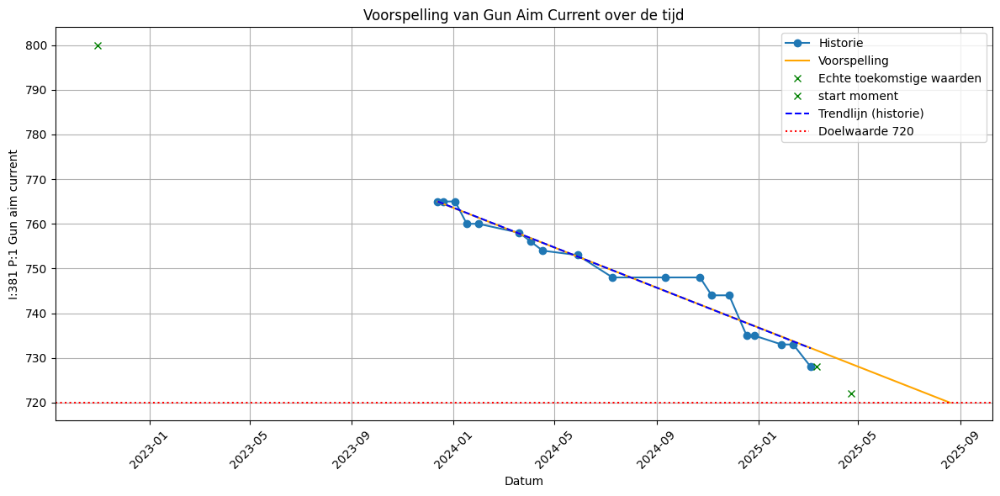

In [ ]:

# Plotten
plt.figure(figsize=(12, 6))
plt.plot(y.index, y.values, label="Historie", marker="o")
plt.plot(all_dates, y_full_pred, label="Voorspelling", linestyle="-", color="orange")
plt.plot(y_true.index, y_true.values, label="Echte toekomstige waarden", marker="x", linestyle="None", color="green")
plt.plot(pd.to_datetime("2022-10-31"), 800 , label="start moment", marker="x", linestyle="None", color="green")
plt.plot(y.index, y_trend, label="Trendlijn (historie)", color="blue", linestyle="--")
plt.axhline(720, color='red', linestyle=':', label="Doelwaarde 720")

plt.xlabel("Datum")
plt.ylabel("I:381 P:1 Gun aim current")
plt.title("Voorspelling van Gun Aim Current over de tijd")
plt.xticks(rotation=45)
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()



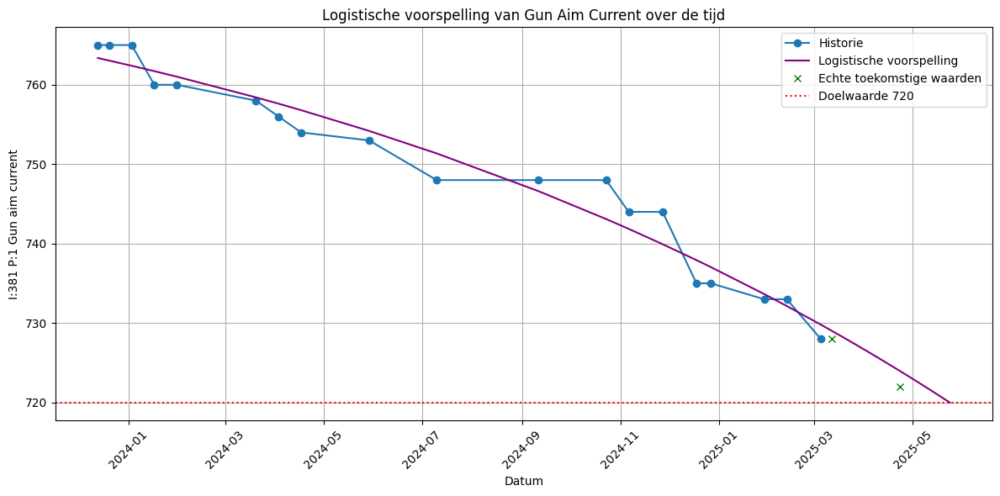

In [ ]:
from scipy.optimize import curve_fit

# select data
df = pivoted[pivoted["linac"] == 2191].copy()
df = df.set_index("date").sort_index()
df = df.drop(["2025-04-30", "2025-05-14"])
df.index = pd.to_datetime(df.index)

# target
colname = "381_1.0_Gun aim current"

# won't be used for training
true_dates = ["2025-03-12", "2025-04-23"]
y_true = df.loc[true_dates, colname]
df = df.drop(true_dates)
y = df[colname]

# changes dates to amount of days
start_date = y.index.min()
df["days_since_start"] = (df.index - start_date).days
X_days = df["days_since_start"].values
X = X_days.reshape(-1, 1)

# LOGISTIC FUNCTION DEFINITION 
def logistic(x, L, k, x0):
    return L / (1 + np.exp(-k * (x - x0)))

# FITTING LOGISTIC FUNCTION 
p0 = [max(y), 0.01, np.median(X_days)]
popt, _ = curve_fit(logistic, X_days, y, p0, maxfev=10000)
L, k, x0 = popt

# prediction
future_steps = 0
y_logistic_pred = pd.Series([800])  

while y_logistic_pred.min() > 720:
    future_steps += 1
    future_dates = pd.date_range(start=y.index[-1] + pd.Timedelta(days=1), periods=future_steps)
    X_future_days = (future_dates - start_date).days.values
    X_all_days = np.concatenate([X_days, X_future_days])
    y_logistic_pred = logistic(X_all_days, *popt)

# plot
plt.figure(figsize=(12, 6))
plt.plot(y.index, y.values, label="Historie", marker="o")
plt.plot(pd.to_datetime(np.concatenate([y.index, future_dates])), y_logistic_pred, label="Logistische voorspelling", linestyle="-", color="purple")
plt.plot(y_true.index, y_true.values, label="Echte toekomstige waarden", marker="x", linestyle="None", color="green")
plt.axhline(720, color='red', linestyle=':', label="Doelwaarde 720")

plt.xlabel("Datum")
plt.ylabel("I:381 P:1 Gun aim current")
plt.title("Logistische voorspelling van Gun Aim Current over de tijd")
plt.xticks(rotation=45)
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()


logistische lijn ziet er veel beter uit.

Als deze zelfde lijn over verschillende linacs wordt getrokken?

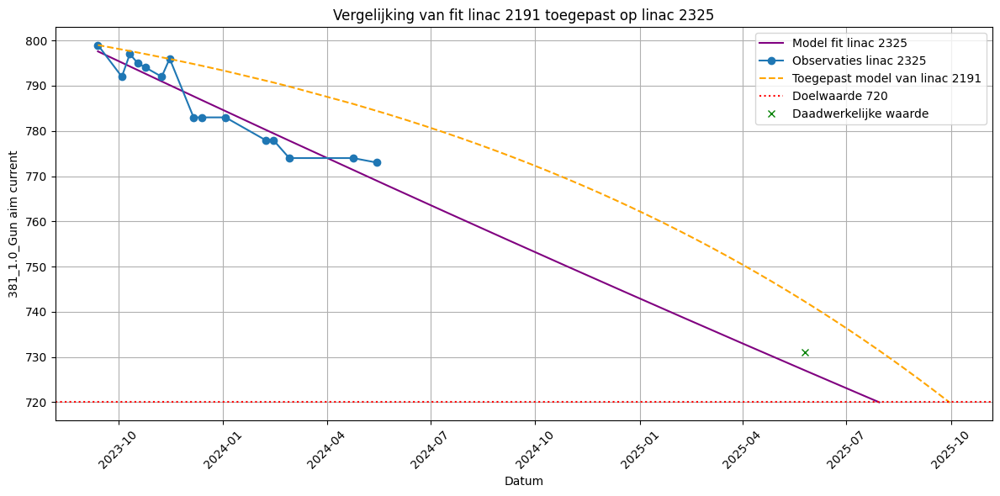

Laatste voorspelde datum onder 720 voor linac 2325: 2025-07-30 00:00:00
Laatste voorspelde datum onder 720 met toegepast model: 2025-09-30 00:00:00


In [ ]:
colname = "381_1.0_Gun aim current"
model_linac_id = 2191
other_linac_id = 2325

# model trainen of linac 2325
df = pivoted[pivoted["linac"] == other_linac_id].copy()
df = df.set_index("date").sort_index()
df.index = pd.to_datetime(df.index)
y = df[colname]

# changes dates to amount of days
start_date = y.index.min()
df["days_since_start"] = (df.index - start_date).days
X_days = df["days_since_start"].values
X = X_days.reshape(-1, 1)

# model training on linac 2325 with 2191
df_other = pivoted[pivoted["linac"] == other_linac_id].copy()
df_other = df_other.set_index("date").sort_index()
df_other.index = pd.to_datetime(df_other.index)
df_other = df_other.dropna(subset=[colname])
df_other["days_since_start"] = (df_other.index - start_date).days
X_other_days = df_other["days_since_start"].values

# predict until 720 with the model of 2191
future_steps_other = 1
future_dates_other = pd.date_range(start=df_other.index[-1] + pd.Timedelta(days=1), periods=future_steps_other)
X_future_other = (future_dates_other - start_date).days.values
X_combined = np.concatenate([X_other_days, X_future_other])

# Offset corrigeren op basis van eerste waarde
offset = df_other[colname].values[0] - logistic(X_other_days[0], *popt)
y_pred_other = logistic(X_combined, *popt) + offset

while y_pred_other[-1] > 720:
    future_steps_other += 1
    future_dates_other = pd.date_range(start=df_other.index[-1] + pd.Timedelta(days=1), periods=future_steps_other)
    X_future_other = (future_dates_other - start_date).days.values
    X_combined = np.concatenate([X_other_days, X_future_other])
    y_pred_other = logistic(X_combined, *popt) + offset


# Fit logistic function
p0 = [max(y), 0.01, np.median(X_days)]
popt, _ = curve_fit(logistic, X_days, y, p0, maxfev=100000)
L, k, x0 = popt

# predict model of 2325
future_steps = 0
y_logistic_pred = pd.Series([800])
while y_logistic_pred.min() > 720:
    future_steps += 1
    future_dates = pd.date_range(start=y.index[-1] + pd.Timedelta(days=1), periods=future_steps)
    X_future_days = (future_dates - start_date).days.values
    X_all_days = np.concatenate([X_days, X_future_days])
    y_logistic_pred = logistic(X_all_days, *popt)

# plotten
plt.figure(figsize=(12, 6))
plt.plot(pd.to_datetime(np.concatenate([y.index, future_dates])), y_logistic_pred, label="Model fit linac 2325", linestyle="-", color="purple")

plt.plot(df_other.index, df_other[colname].values, label=f"Observaties linac {other_linac_id}", marker="o")
plt.plot(pd.to_datetime(np.concatenate([df_other.index, future_dates_other])), y_pred_other, label=f"Toegepast model van linac {model_linac_id}", linestyle="--", color="orange")

plt.axhline(720, color='red', linestyle=':', label="Doelwaarde 720")
plt.plot(pd.to_datetime("2025-05-26") , 731, label="Daadwerkelijke waarde", marker="x", linestyle="None", color="green")

plt.xlabel("Datum")
plt.ylabel(colname)
plt.title(f"Vergelijking van fit linac {model_linac_id} toegepast op linac {other_linac_id}")
plt.xticks(rotation=45)
plt.grid()
plt.legend()
plt.tight_layout()
plt.show()

print("Laatste voorspelde datum onder 720 voor linac 2325:", future_dates[-1])
print("Laatste voorspelde datum onder 720 met toegepast model:", future_dates_other[-1])

Dan lijkt de eigen getrainde model voorspelling accurater te zijn. Dit kan komen omdat iedere linac echt afhankelijk is van eigen items. Of omdat de getrainde lijn van linac 2191 pas vanaf 770 gaat.


BE63

Dit zijn calibratie bestanden, elk bestand heeft 697 items met 1 part nummer.

In [ ]:
#load translate tabel
translate_tbl = pd.read_csv("data/Itemparts.csv")

#get the be63 files
be63_df = merged_df[merged_df["file_name"].str.contains("Be63")]
be63_df["Part&item"] = "I:"+ be63_df["item"].astype(str) + " P:"+ be63_df["part"].astype(str)

be63_files = be63_df["file_name"].unique().tolist()

# the unique parts en how much they been changed
partnum = pd.DataFrame(index=be63_files)
partnum["parts"] = [int(be63_df[be63_df["file_name"] == file]["part"].unique()) for file in be63_files]
partnum["Amount of dates"] = [len(be63_df[be63_df["file_name"] == file]["date"].unique().tolist()) for file in be63_files]
partnum["index"] = be63_files
partnum = partnum.merge(translate_tbl[["Part No.", "Part Name", "Description"]], left_on="parts", right_on="Part No.", how="left").drop(columns="Part No.").set_index("index")

partnum.sort_index()

C:\Users\Laris\AppData\Local\Temp\ipykernel_22448\357607509.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Laris\AppData\Local\Temp\ipykernel_22448\357607509.py:12: DeprecationWarning:

Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)



,parts,Amount of dates,Part Name,Description
index,,,,
Be6300,18,3,Item type,This part defines how an item is treated.
Be6302,2,3,Tolerance high,This part sets the high limit of the value in ...
Be6303,6,3,Tolerance low,This part sets the low limit of the value in p...
Be6304,13,3,Access pointer,This part is the index to all fac 1 arrays and...
Be6305,17,28,Default frequency,This part defines default frequency queue.
Be6306,14,3,Access mask,This part is used to distinguish between incom...
Be6308,15,3,Action mask,This part determines the action to be taken wh...
Be6310,10,28,Calibration offset,This part is the offset value that is applied ...
Be6311,11,28,Calibration gain,This part is the gain value that is applied to...


In [ ]:
# remove the ones with 3 dates cause those have to little to look at
partnum = partnum[partnum["Amount of dates"] > 3]

In [ ]:
total_changes = []
total_changes_df = {}
for file in partnum.index:
    be6300 = be63_df[be63_df["file_name"] == file].copy()

    nop45 = be6300[be6300["part"] != 45]

    for linac in list(set(nop45["linac"])):
        result = pd.DataFrame()

        linec_df = nop45[nop45["linac"] == linac]
        dates = list(set(linec_df["date"]))

        for item in range(len(dates)-1):
            old = linec_df[linec_df["date"] == dates[item]]
            new = linec_df[linec_df["date"] == dates[item+1]]

            diff = new["value"].values - old["value"].values
            temp = pd.DataFrame({
                "date": new["date"].tolist(),
                "difference": diff,
                "PI": new["Part&item"],
                "linac": new["linac"]
            })

            result = pd.concat([temp, result])
            

    changed = result[result["difference"] != 0]

    changes = changed["PI"].unique().tolist()

    total_changes.append(changes)

    #only the changed combination of part and item
    changes_df = be6300[be6300["Part&item"].isin(changes)]
    total_changes_df[file] = changes_df


partnum["veranderingen"] = [len(change) for change in total_changes]
partnum.sort_index()

,parts,Amount of dates,Part Name,Description,veranderingen
index,,,,,
Be6305,17,28,Default frequency,This part defines default frequency queue.,0
Be6310,10,28,Calibration offset,This part is the offset value that is applied ...,7
Be6311,11,28,Calibration gain,This part is the gain value that is applied to...,1
Be6312,12,28,Calibration inverse,This part is the inverse gain value that is ap...,1
Be6313,16,28,Parent interlock,This part defines hierarchy of interlocks. If ...,0
Be6315,38,28,Coupled item,This part enables control of a particular item...,10
Be6316,39,28,Coupled part,This part enables control of a particular part...,3
Be6317,141,28,Gain 1,"The function of p141 varies, depending on the ...",12
Be6317,141,28,Gain 1,The positional loop gain value,12


File: Be6310  
Part 10: This part is the offset value that is applied to part 111 during calibration.

2983
2325
2638
2191


item,33,34,35,36,130,234,235
part,10.0,10.0,10.0,10.0,10.0,10.0,10.0
category,Beam dose channel 1 monitor,Beam dose channel 2 monitor,Segment dose channel 1 monitor,Segment dose channel 2 monitor,Table angle start,Monitor slits leg 1,Monitor slits leg 2
count,13.00,13.00,13.00,13.00,13.00,13.00,13.00
mean,11564.08,11570.69,1490.46,1801.31,-2000.00,-7730.85,-7730.85
std,15154.50,15156.49,4653.30,4571.02,0.00,14272.80,14272.80
min,0.00,0.00,-1538.00,-895.00,-2000.00,-32767.00,-32767.00
25%,21.00,22.00,-1536.00,-895.00,-2000.00,-220.00,-220.00
50%,164.00,183.00,6.00,1.00,-2000.00,-220.00,-220.00
75%,29981.00,29990.00,1280.00,1409.00,-2000.00,-220.00,-220.00
max,29981.00,29990.00,12800.00,13057.00,-2000.00,-220.00,-220.00


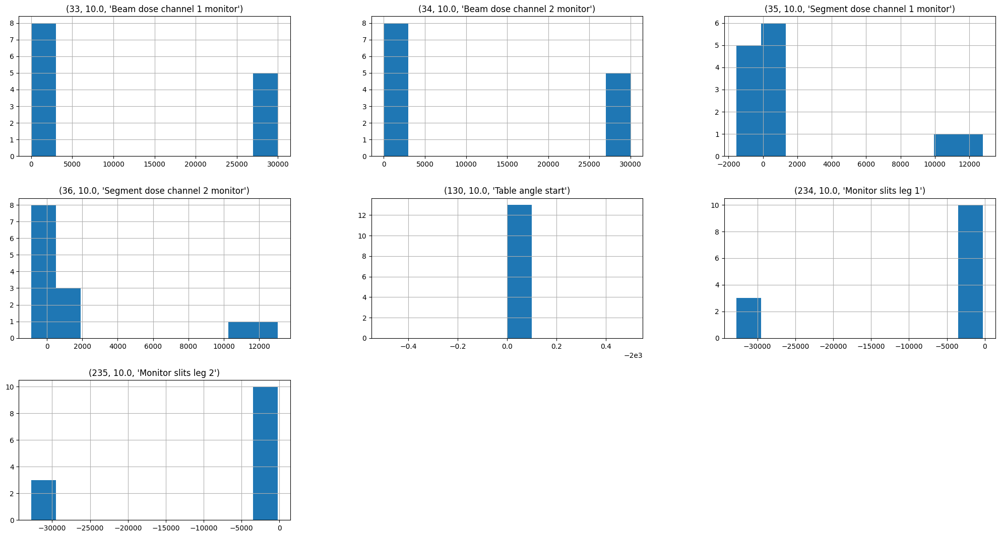

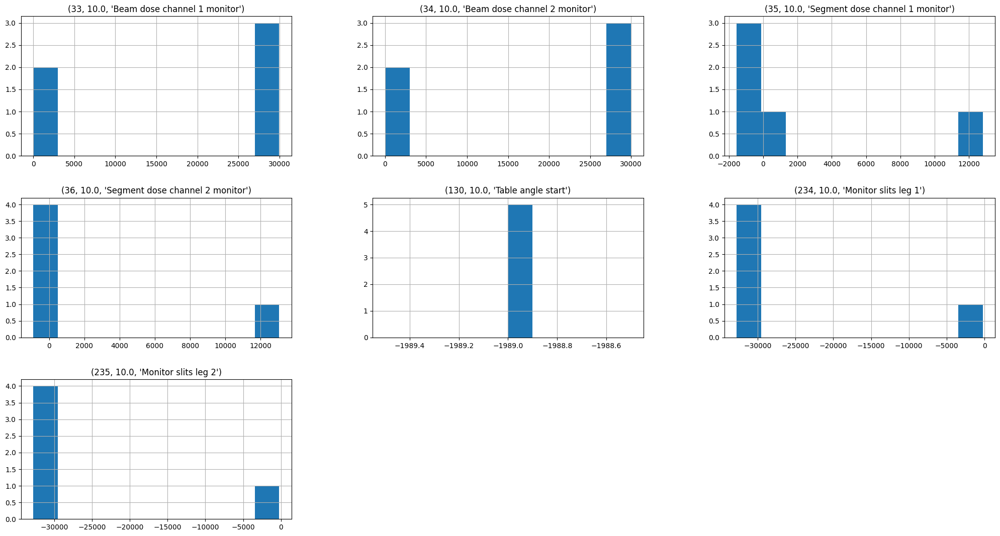

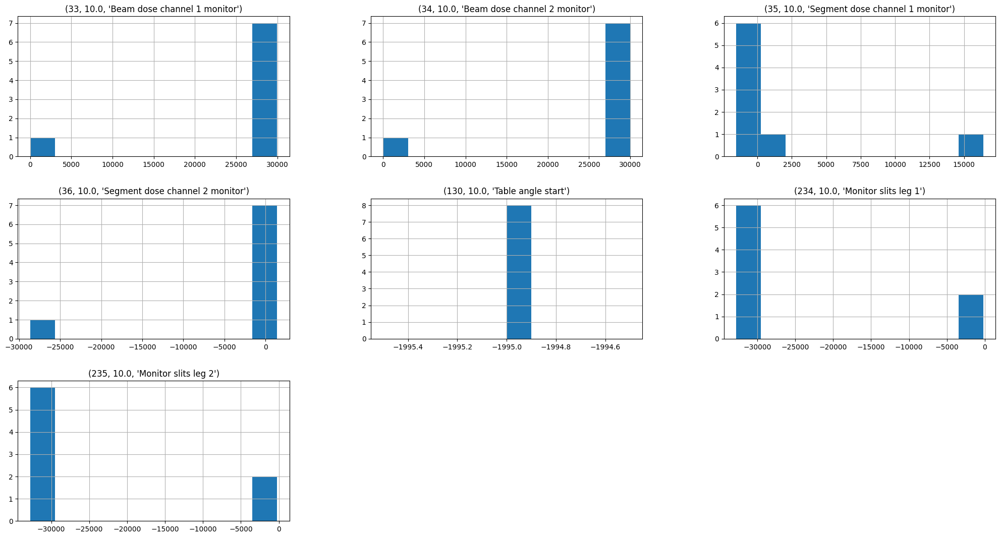

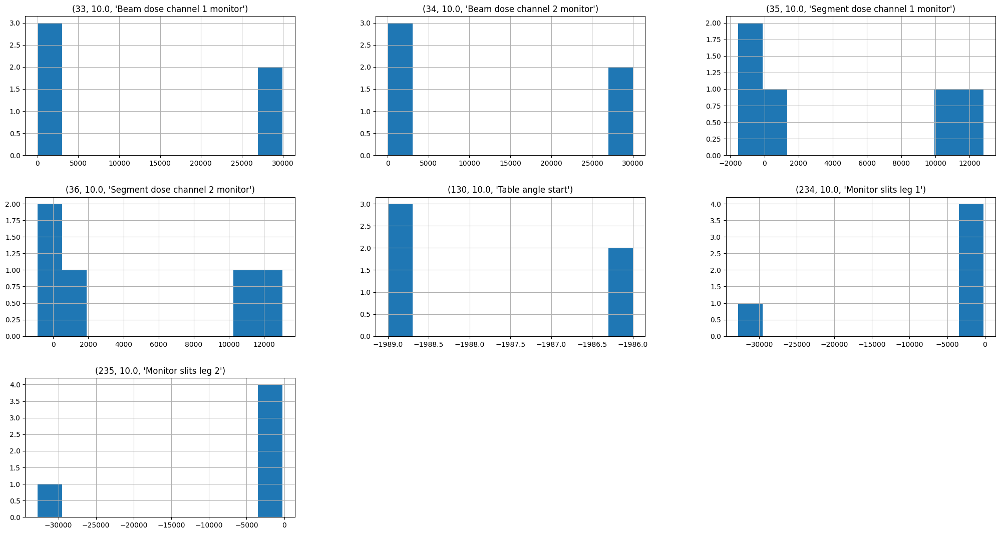

In [ ]:
changes_df = total_changes_df["Be6310"]
histograms = pd.DataFrame()

# for every linac the describe of the same data
for linac in list(set(changes_df["linac"])):
    print(linac)
    pivoted_be63 = changes_df[changes_df["linac"] == linac].pivot(index="date", columns=["item", "part", "category"], values="value")
    describing = pivoted_be63.describe()
    histograms = pd.concat([histograms, describing])
    pivoted_be63.hist(figsize=(25,13));

histograms.round(2)
   

In [ ]:
for x in range(len(histograms.columns)):  
    p_I = histograms.columns[x][:2]


    fig = px.line(be63_df[be63_df["Part&item"] == f"I:{p_I[0]} P:{p_I[1]}"], x="date", y ="value", color="linac", hover_data=["Part&item", "category"],markers=True, title=f"I:{p_I[0]} P:{p_I[1]}")
    fig.show()

File: Be6311  
Part 11: This part is the gain value that is applied to part 110 during calibration.

2983
2325
2638
2191


item,130
part,11.0
category,Table angle start
count,13.00
mean,249.00
std,0.00
min,249.00
25%,249.00
50%,249.00
75%,249.00
max,249.00


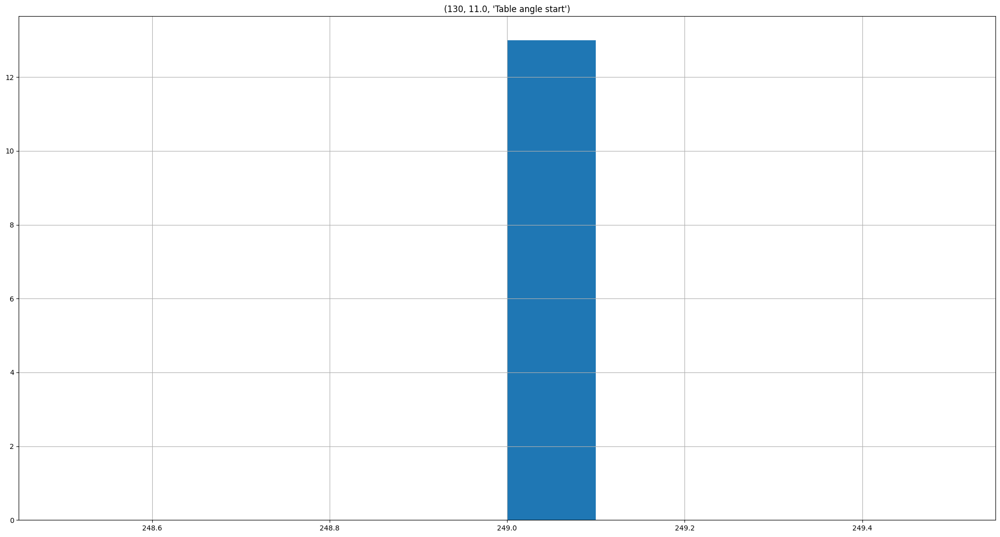

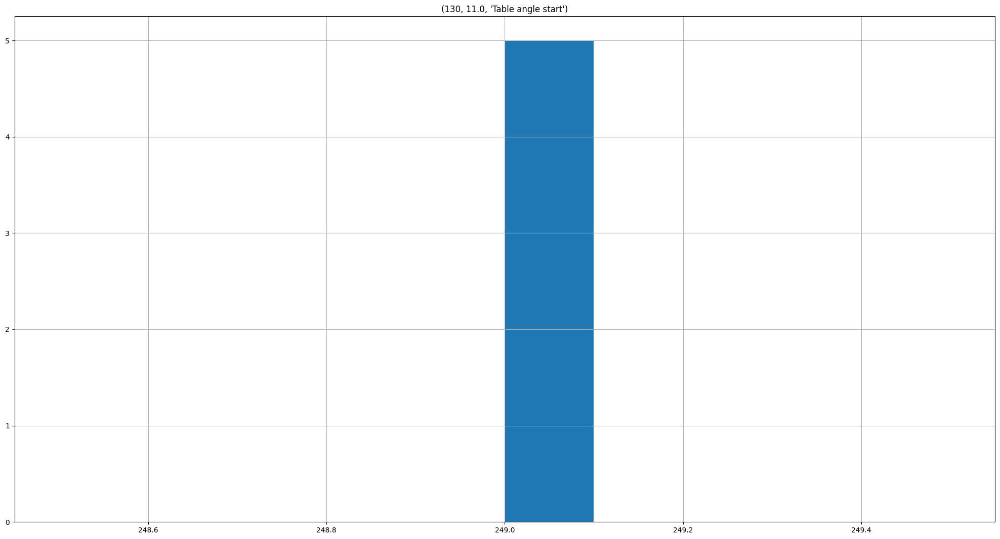

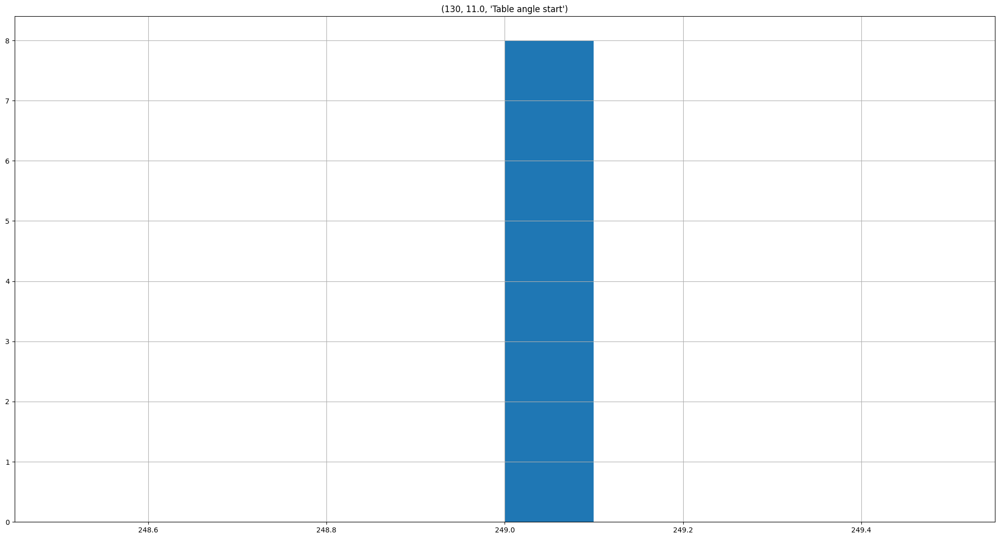

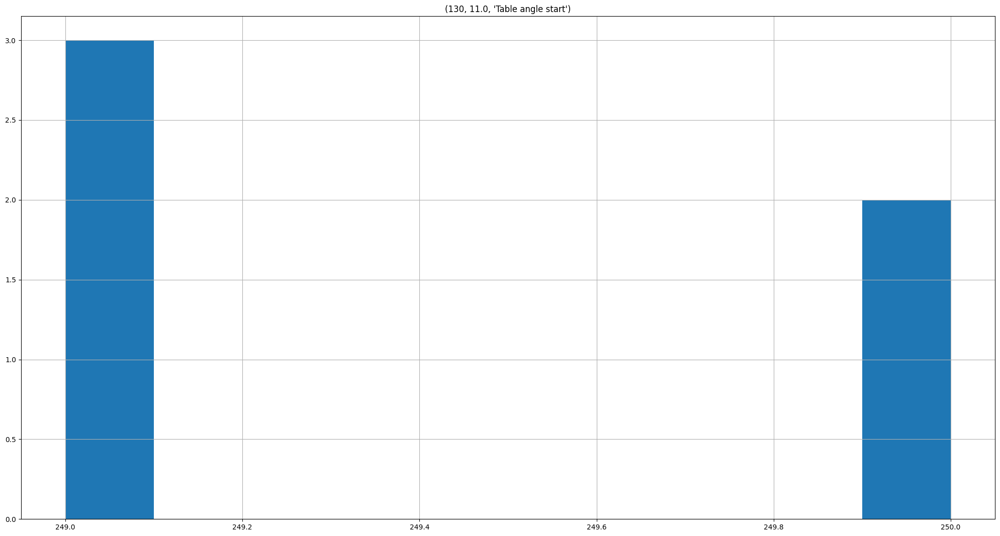

In [ ]:
changes_df = total_changes_df["Be6311"]
histograms = pd.DataFrame()

# for every linac the describe of the same data
for linac in list(set(changes_df["linac"])):
    print(linac)
    pivoted_be63 = changes_df[changes_df["linac"] == linac].pivot(index="date", columns=["item", "part", "category"], values="value")
    describing = pivoted_be63.describe()
    histograms = pd.concat([histograms, describing])
    pivoted_be63.hist(figsize=(25,13));

histograms.round(2)
   

In [ ]:
for x in range(len(histograms.columns)):  
    p_I = histograms.columns[x][:2]

    fig = px.line(be63_df[be63_df["Part&item"] == f"I:{p_I[0]} P:{p_I[1]}"], x="date", y ="value", color="linac", hover_data=["Part&item", "category"],markers=True, title=f"I:{p_I[0]} P:{p_I[1]}")
    fig.show()

File: Be6312  
Part 12: This part is the inverse gain value that is applied to limits to obtain raw limits.

2983
2325
2638
2191


item,130
part,12.0
category,Table angle start
count,13.00
mean,16845.00
std,0.00
min,16845.00
25%,16845.00
50%,16845.00
75%,16845.00
max,16845.00


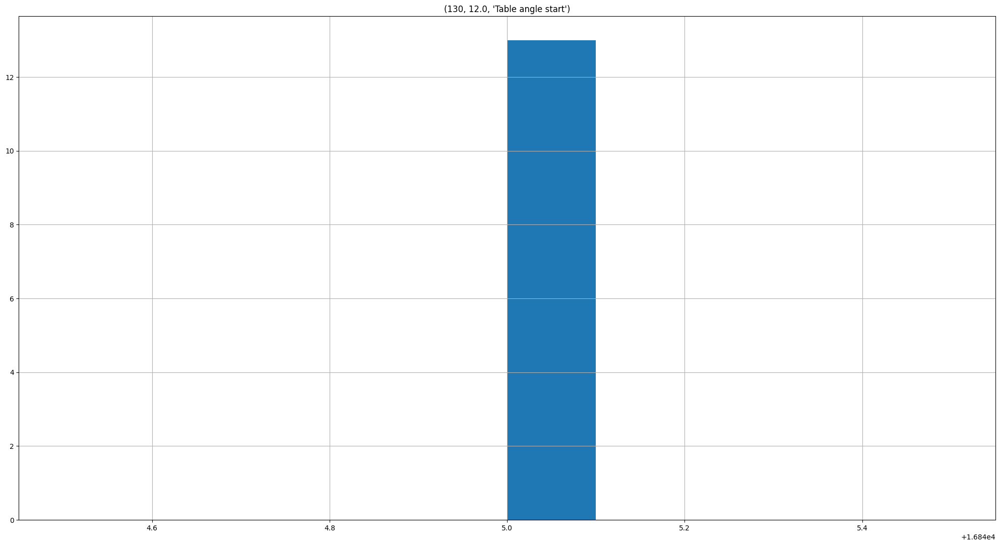

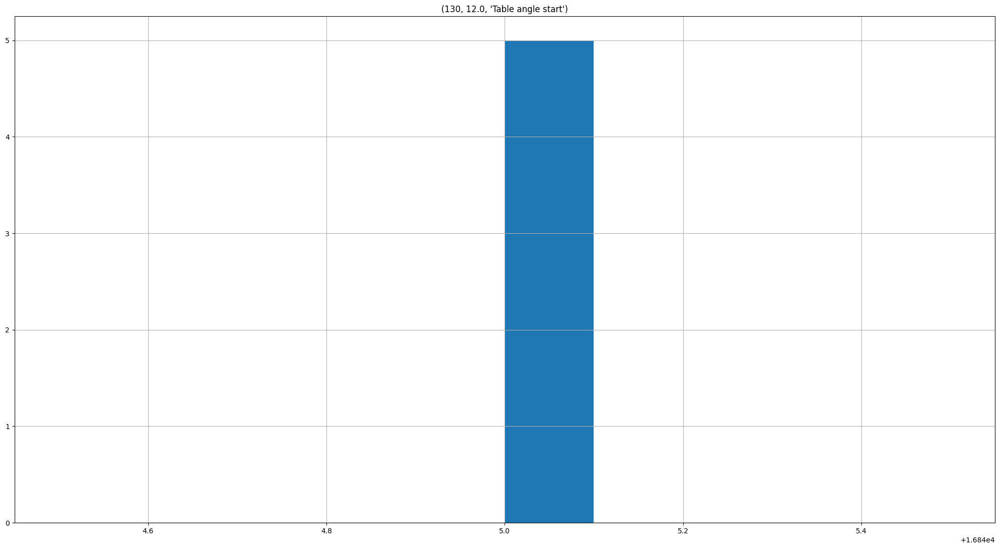

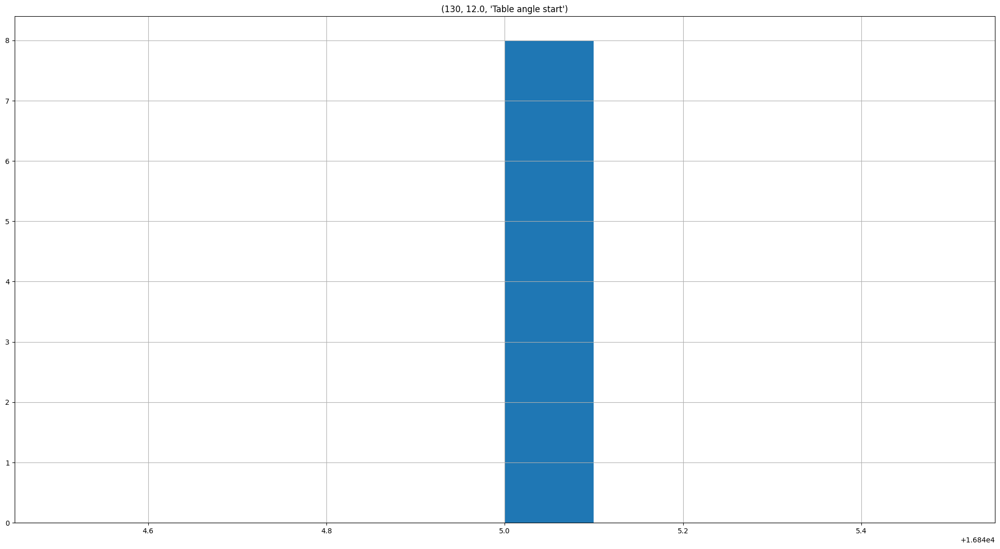

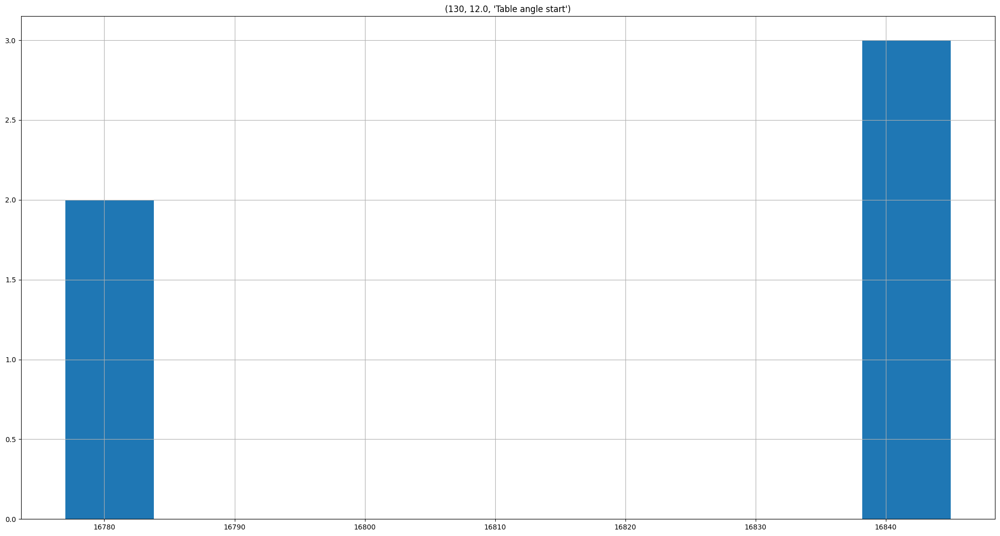

In [ ]:
changes_df = total_changes_df["Be6312"]
histograms = pd.DataFrame()

# for every linac the describe of the same data
for linac in list(set(changes_df["linac"])):
    print(linac)
    pivoted_be63 = changes_df[changes_df["linac"] == linac].pivot(index="date", columns=["item", "part", "category"], values="value")
    describing = pivoted_be63.describe()
    histograms = pd.concat([histograms, describing])
    pivoted_be63.hist(figsize=(25,13));

histograms.round(2)
   

In [ ]:
for x in range(len(histograms.columns)):  
    p_I = histograms.columns[x][:2]

    fig = px.line(be63_df[be63_df["Part&item"] == f"I:{p_I[0]} P:{p_I[1]}"], x="date", y ="value", color="linac", hover_data=["Part&item", "category"],markers=True, title=f"I:{p_I[0]} P:{p_I[1]}")
    fig.show()

File: Be6315  
Part 38: This part enables control of a particular item from a separate item enabling access to item that are not directly accessible.

2983
2325
2638
2191


item,161,268,269,270,271,272,273,280,281,327
part,38.0,38.0,38.0,38.0,38.0,38.0,38.0,38.0,38.0,38.0
category,Magnetron tuner control item,Monitor 1V FSR 0V reference,Monitor 10V FSR 0V reference,Monitor 10V FSR 10V reference,Monitor 1V FSR 1V reference,Monitor 10V FSR position reference,Monitor 10V FSR 5V supplies,Monitor 10V FSR neg15V supplies,Monitor 10V FSR pos15V supplies,Set gun filament current
count,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00
mean,1051.62,2.15,2.15,2.23,2.23,2.54,2.15,2.15,2.38,0.00
std,30.91,1.41,1.41,1.48,1.48,1.56,2.12,2.12,2.02,0.00
min,1033.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
25%,1044.00,1.00,1.00,1.00,1.00,1.00,0.00,0.00,0.00,0.00
50%,1044.00,2.00,2.00,2.00,2.00,3.00,2.00,2.00,3.00,0.00
75%,1044.00,3.00,3.00,3.00,3.00,4.00,4.00,4.00,4.00,0.00
max,1154.00,5.00,5.00,5.00,5.00,5.00,5.00,5.00,5.00,0.00


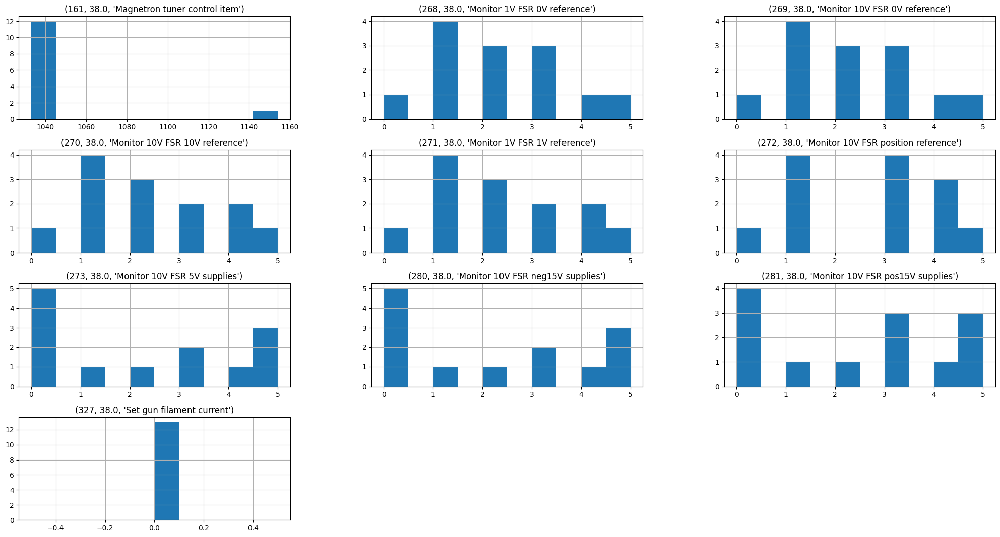

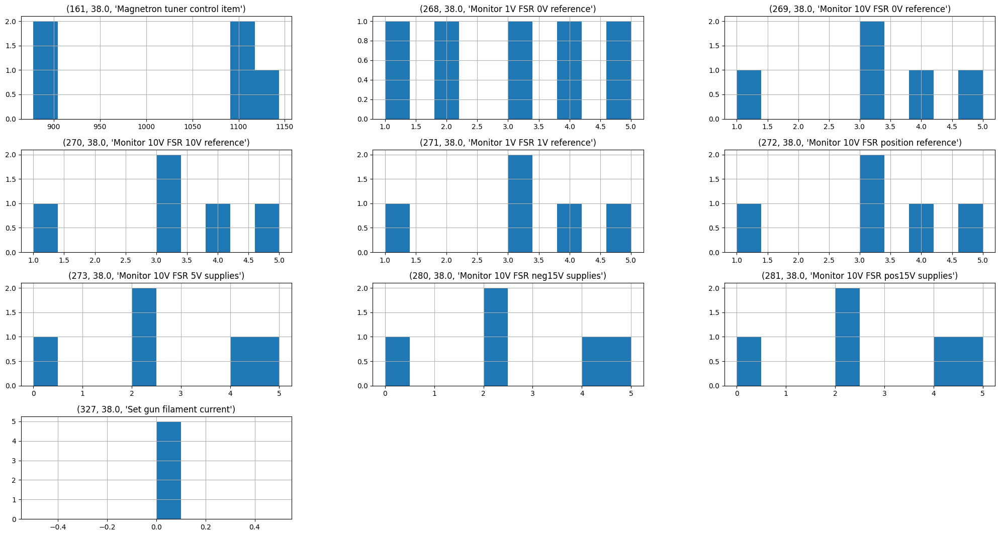

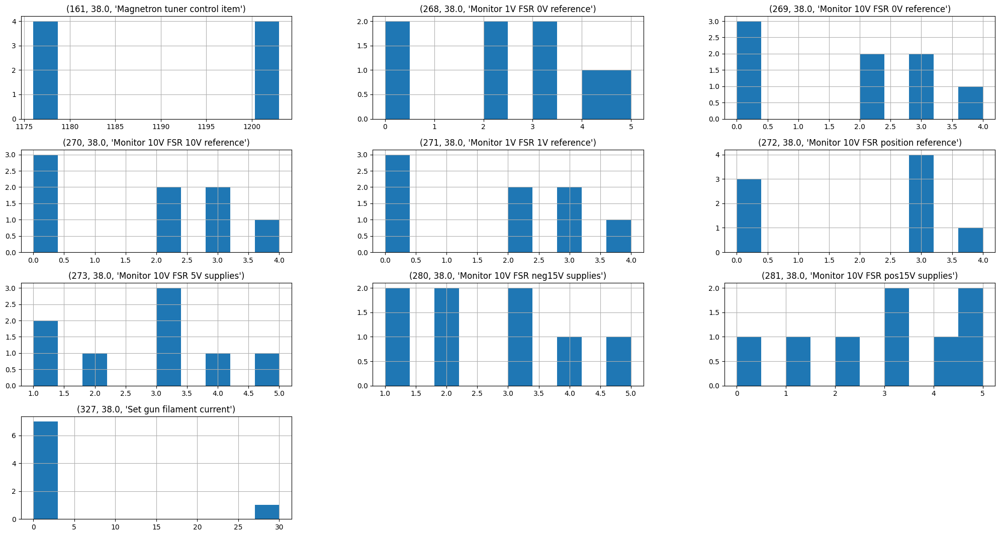

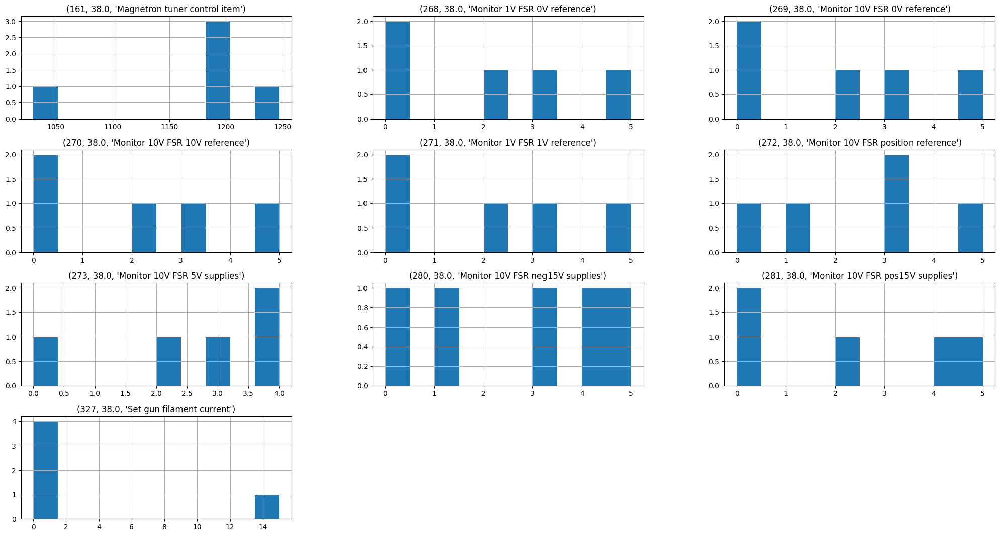

In [ ]:
changes_df = total_changes_df["Be6315"]
histograms = pd.DataFrame()

# for every linac the describe of the same data
for linac in list(set(changes_df["linac"])):
    print(linac)
    pivoted_be63 = changes_df[changes_df["linac"] == linac].pivot(index="date", columns=["item", "part", "category"], values="value")
    describing = pivoted_be63.describe()
    histograms = pd.concat([histograms, describing])
    pivoted_be63.hist(figsize=(25,13));

histograms.round(2)
   

In [ ]:
for x in range(len(histograms.columns)):  
    p_I = histograms.columns[x][:2]

    fig = px.line(be63_df[be63_df["Part&item"] == f"I:{p_I[0]} P:{p_I[1]}"], x="date", y ="value", color="linac", hover_data=["Part&item", "category"],markers=True, title=f"I:{p_I[0]} P:{p_I[1]}")
    fig.show()

File: Be6316  
Part 141: The positional loop gain value

2983
2325
2638
2191


item,272,273,327
part,39.0,39.0,39.0
category,Monitor 10V FSR position reference,Monitor 10V FSR 5V supplies,Set gun filament current
count,13.00,13.00,13.00
mean,87.15,91.62,0.00
std,21.73,25.82,0.00
min,66.00,72.00,0.00
25%,66.00,72.00,0.00
50%,76.00,72.00,0.00
75%,112.00,123.00,0.00
max,115.00,123.00,0.00


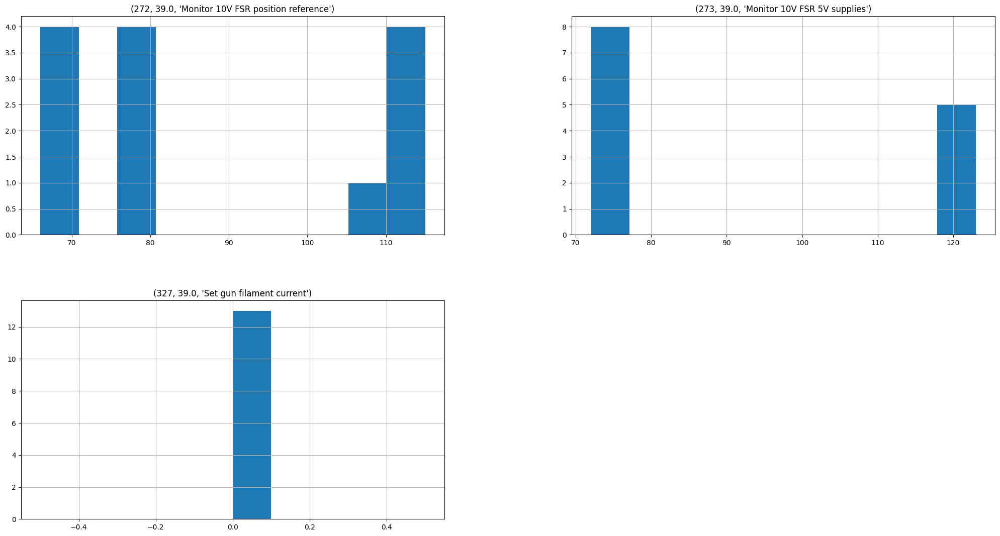

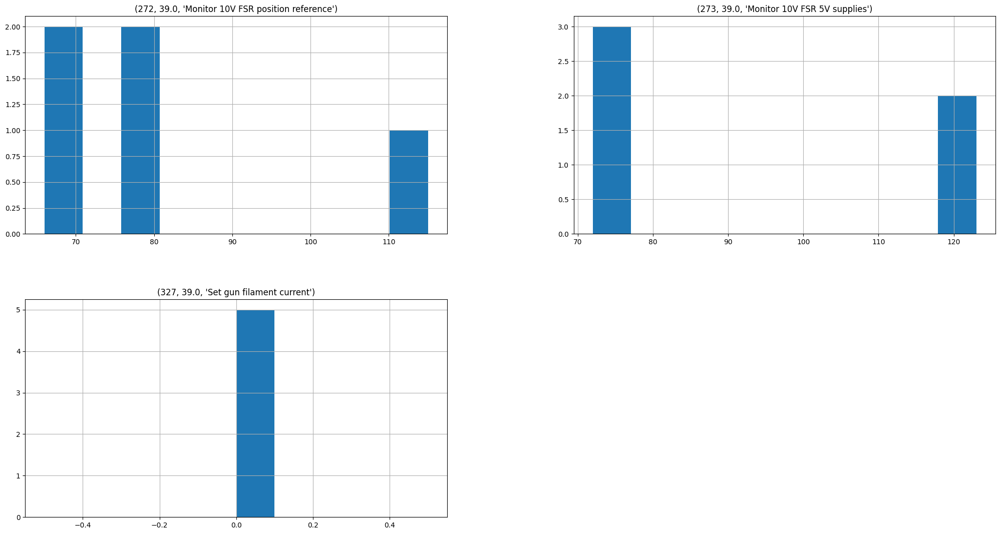

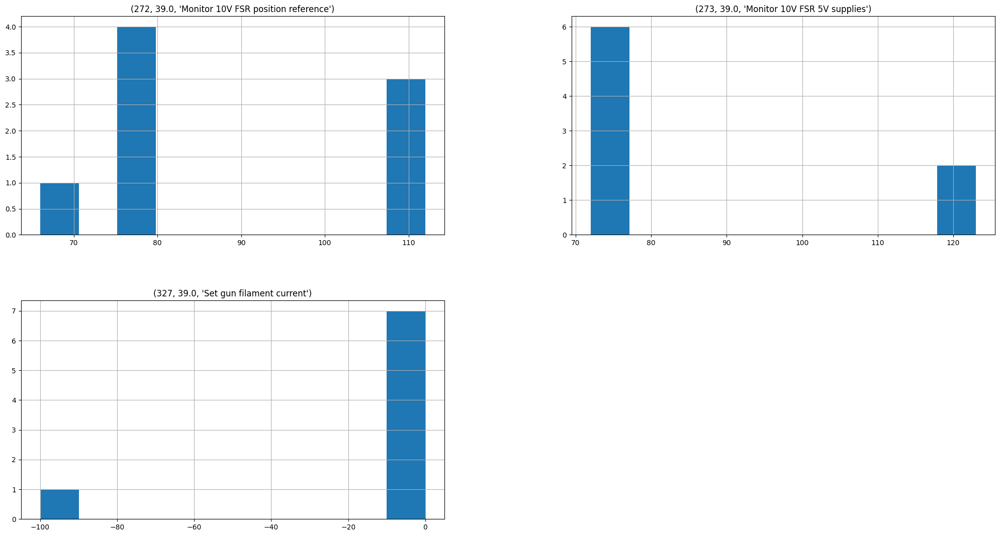

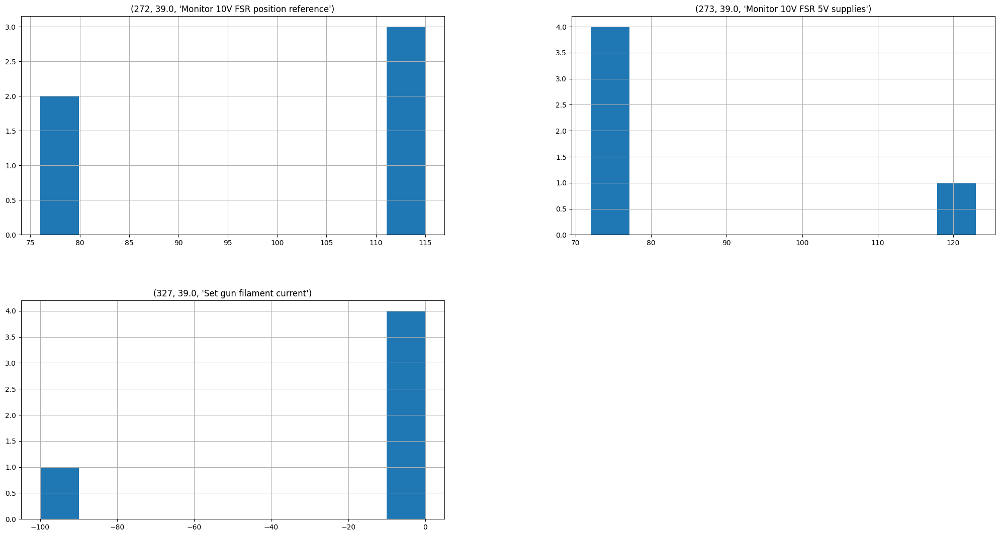

In [ ]:
changes_df = total_changes_df["Be6316"]
histograms = pd.DataFrame()

# for every linac the describe of the same data
for linac in list(set(changes_df["linac"])):
    print(linac)
    pivoted_be63 = changes_df[changes_df["linac"] == linac].pivot(index="date", columns=["item", "part", "category"], values="value")
    describing = pivoted_be63.describe()
    histograms = pd.concat([histograms, describing])
    pivoted_be63.hist(figsize=(25,13));

histograms.round(2)
   

In [ ]:
for x in range(len(histograms.columns)):  
    p_I = histograms.columns[x][:2]

    fig = px.line(be63_df[be63_df["Part&item"] == f"I:{p_I[0]} P:{p_I[1]}"], x="date", y ="value", color="linac", hover_data=["Part&item", "category"],markers=True, title=f"I:{p_I[0]} P:{p_I[1]}")
    fig.show()

File: Be6318  
Part 142: "The output or loop gain (for example, calibration of beam error values, phase gain of magnetron tuner system)."

2983
2325
2638
2191


item,124,127,128,161,164,166
part,142.0,142.0,142.0,142.0,142.0,142.0
category,Hump balance input item,2R plates ratio,2T plates ratio,Magnetron tuner control item,Flatness 2R servo block,Hump error monitor
count,13.00,13.00,13.00,13.00,13.00,13.00
mean,-922.15,1772.46,1781.54,-384.62,66.15,-459.23
std,199.36,523.70,562.57,219.26,30.70,1081.03
min,-1024.00,840.00,200.00,-500.00,50.00,-1024.00
25%,-1024.00,2048.00,2048.00,-500.00,50.00,-1024.00
50%,-1024.00,2048.00,2048.00,-500.00,50.00,-1024.00
75%,-1024.00,2048.00,2048.00,-500.00,50.00,-1024.00
max,-515.00,2048.00,2048.00,0.00,120.00,1790.00


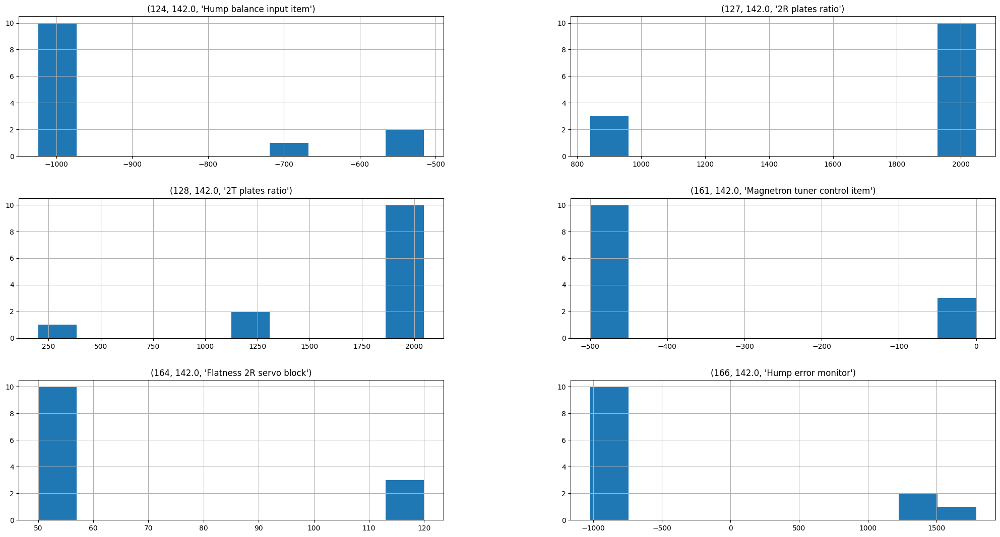

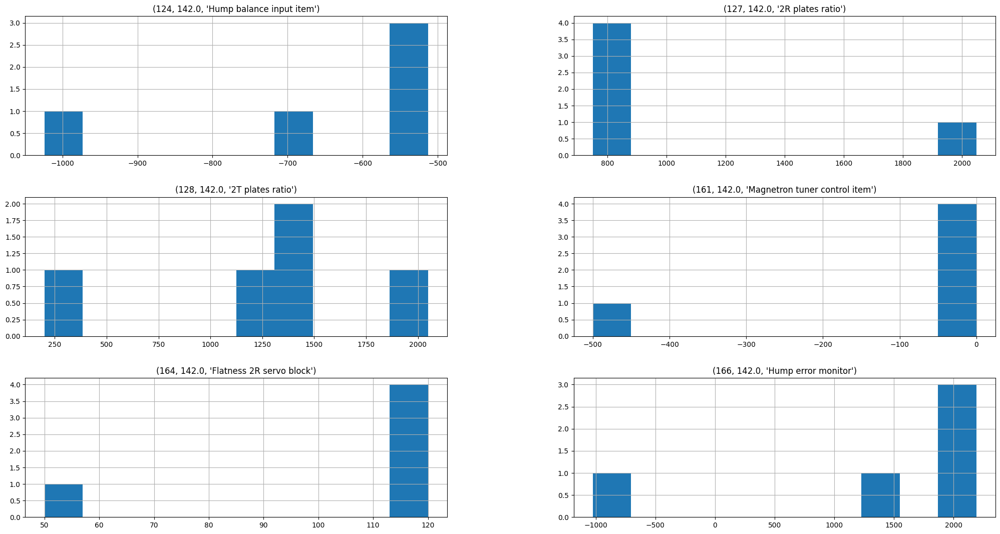

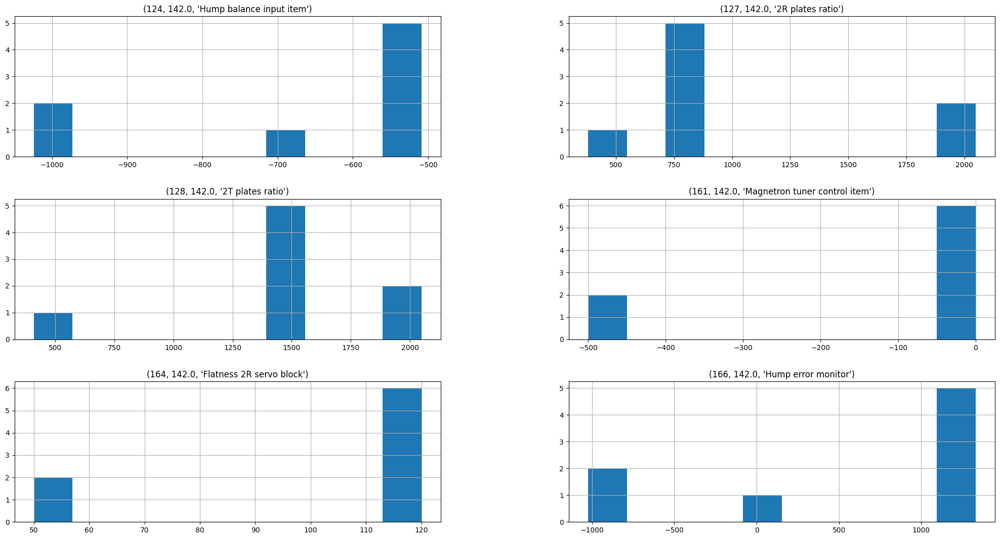

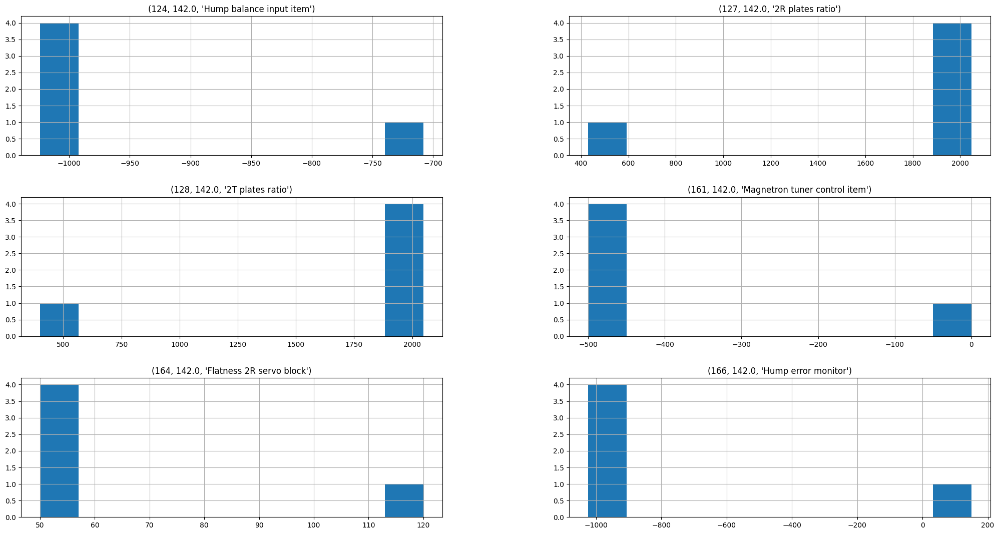

In [ ]:
changes_df = total_changes_df["Be6318"]
histograms = pd.DataFrame()

# for every linac the describe of the same data
for linac in list(set(changes_df["linac"])):
    print(linac)
    pivoted_be63 = changes_df[changes_df["linac"] == linac].pivot(index="date", columns=["item", "part", "category"], values="value")
    describing = pivoted_be63.describe()
    histograms = pd.concat([histograms, describing])
    pivoted_be63.hist(figsize=(25,13));

histograms.round(2)
   

In [ ]:
for x in range(len(histograms.columns)):  
    p_I = histograms.columns[x][:2]

    fig = px.line(be63_df[be63_df["Part&item"] == f"I:{p_I[0]} P:{p_I[1]}"], x="date", y ="value", color="linac", hover_data=["Part&item", "category"],markers=True, title=f"I:{p_I[0]} P:{p_I[1]}")
    fig.show()

File: Be6328   
Part 19: This part is the calibrated upper limit.

2983
2325
2638
2191


item,33,34,130,160,199,200,202,203,214,230,...,366,376,384,398,399,446,447,502,515,525
part,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,...,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0,19.0
category,Beam dose channel 1 monitor,Beam dose channel 2 monitor,Table angle start,Uniformity,Wedge monitor,Target type monitor,X-ray primary collimator monitor,Secondary collimator monitor,Magnetron magnet voltage monitor,Monitor LP phase shift position,...,Dose channel difference,High power OK,Bending magnet voltage,Focus 1 voltage,Focus 2 voltage,Primary scatter foil position,Primary scatter foil check,Dose channel 1 auxiliary capacitor monitor,Dose channel 1 mod check,Shutter monitor
count,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,...,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00
mean,11564.08,11570.69,243.00,25216.92,2.77,22.08,2.77,12.77,8670.46,3522.31,...,130.69,0.92,2106.62,8853.15,9224.54,3384.23,3361.15,0.77,0.08,2.54
std,15154.50,15156.49,0.00,14347.35,0.44,1.75,0.44,4.25,3005.57,908.20,...,221.39,0.28,883.63,2750.12,2039.68,1521.70,1394.52,0.44,0.28,0.88
min,0.00,0.00,243.00,50.00,2.00,19.00,2.00,5.00,3352.00,1850.00,...,2.00,0.00,458.00,3411.00,5150.00,715.00,915.00,0.00,0.00,1.00
25%,21.00,22.00,243.00,32767.00,3.00,23.00,3.00,15.00,10252.00,4000.00,...,2.00,1.00,2570.00,10277.00,10277.00,4185.00,4095.00,1.00,0.00,3.00
50%,164.00,183.00,243.00,32767.00,3.00,23.00,3.00,15.00,10252.00,4000.00,...,3.00,1.00,2570.00,10277.00,10277.00,4185.00,4095.00,1.00,0.00,3.00
75%,29981.00,29990.00,243.00,32767.00,3.00,23.00,3.00,15.00,10252.00,4000.00,...,200.00,1.00,2570.00,10277.00,10277.00,4185.00,4095.00,1.00,0.00,3.00
max,29981.00,29990.00,243.00,32767.00,3.00,23.00,3.00,15.00,10252.00,4000.00,...,602.00,1.00,2570.00,10277.00,10277.00,4185.00,4095.00,1.00,1.00,3.00


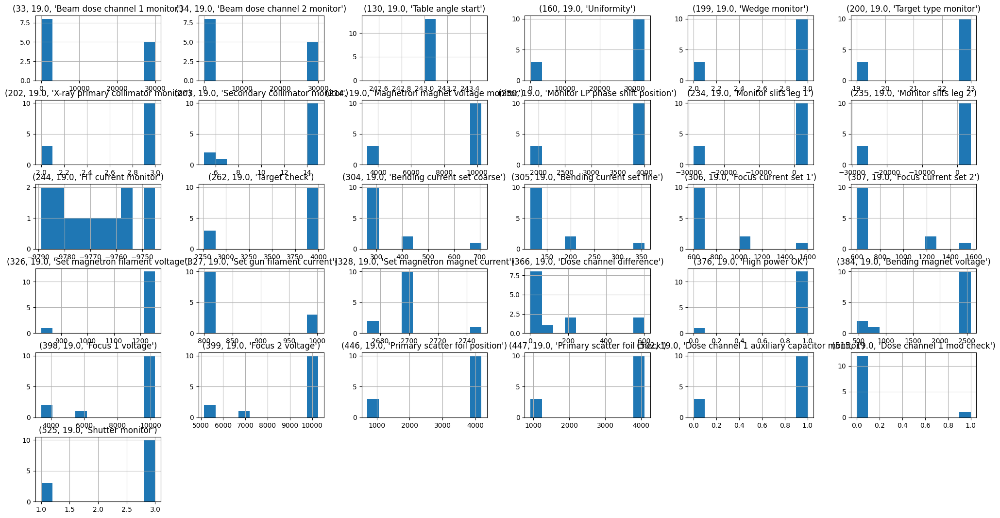

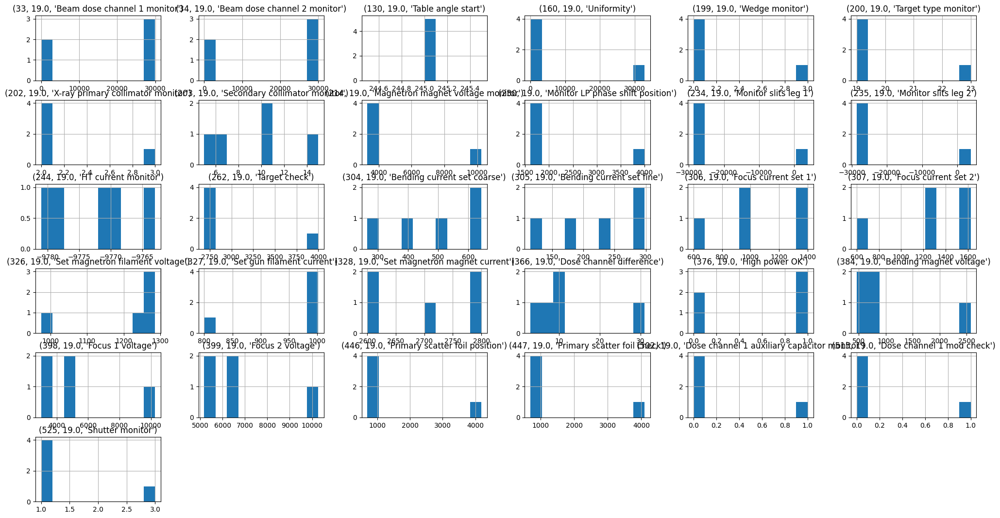

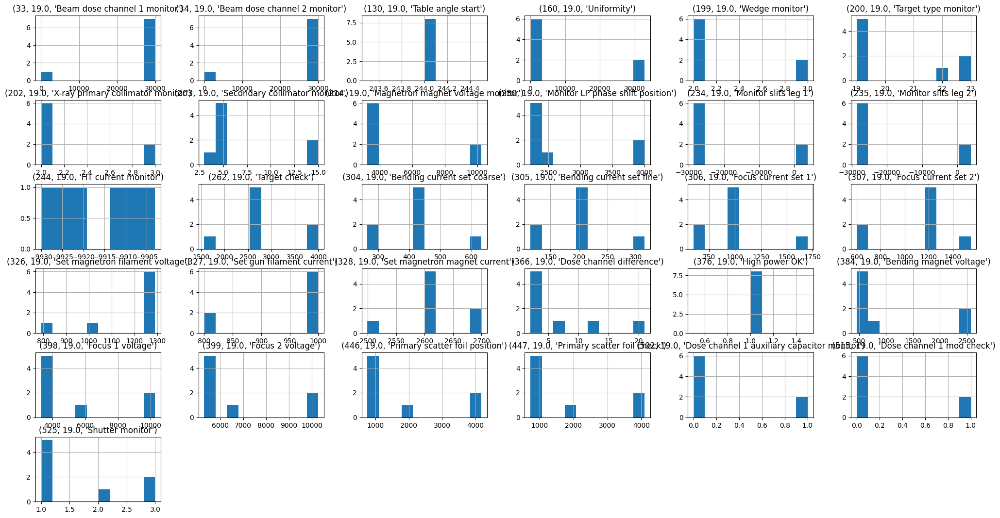

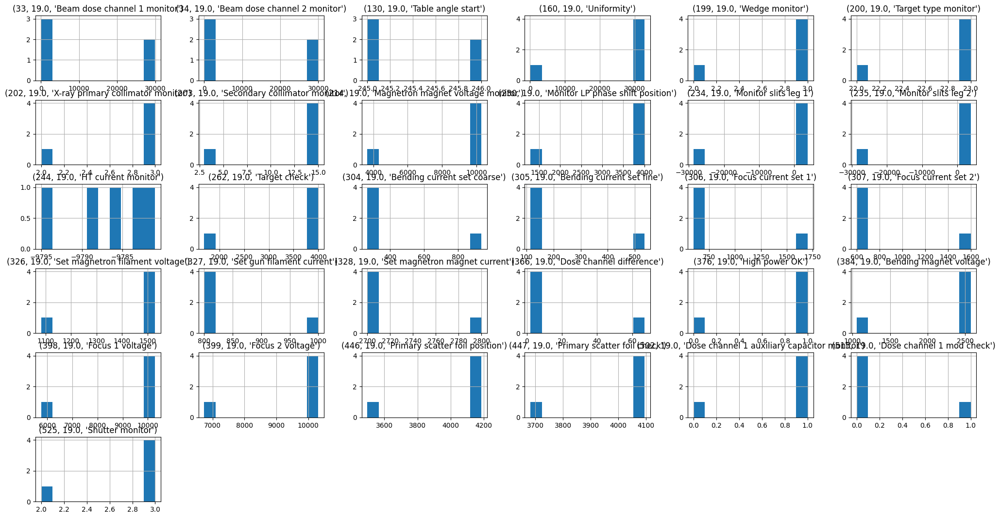

In [ ]:
changes_df = total_changes_df["Be6328"]
histograms = pd.DataFrame()

# for every linac the describe of the same data
for linac in list(set(changes_df["linac"])):
    print(linac)
    pivoted_be63 = changes_df[changes_df["linac"] == linac].pivot(index="date", columns=["item", "part", "category"], values="value")
    describing = pivoted_be63.describe()
    histograms = pd.concat([histograms, describing])
    pivoted_be63.hist(figsize=(25,13));

histograms.round(2)
   

In [ ]:
for x in range(len(histograms.columns)):  
    p_I = histograms.columns[x][:2]

    fig = px.line(be63_df[be63_df["Part&item"] == f"I:{p_I[0]} P:{p_I[1]}"], x="date", y ="value", color="linac", hover_data=["Part&item", "category"],markers=True, title=f"I:{p_I[0]} P:{p_I[1]}")
    fig.show()

I: 244 P: 19, lineair omhoog

File: Be6329  
Part 20: This part is the calibrated lower limit.

2983
2325
2638
2191


item,33,34,199,200,202,203,204,214,230,234,...,328,377,384,398,399,446,447,502,515,525
part,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,...,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0,20.0
category,Beam dose channel 1 monitor,Beam dose channel 2 monitor,Wedge monitor,Target type monitor,X-ray primary collimator monitor,Secondary collimator monitor,Applicator present,Magnetron magnet voltage monitor,Monitor LP phase shift position,Monitor slits leg 1,...,Set magnetron magnet current,Low power OK,Bending magnet voltage,Focus 1 voltage,Focus 2 voltage,Primary scatter foil position,Primary scatter foil check,Dose channel 1 auxiliary capacitor monitor,Dose channel 1 mod check,Shutter monitor
count,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,...,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00,13.00
mean,11564.08,11570.69,0.46,4.38,0.46,1.23,0.00,595.69,499.23,-7167.85,...,2499.38,0.08,104.31,716.77,1042.23,199.62,176.54,0.77,0.08,0.23
std,15154.50,15156.49,0.88,8.33,0.88,2.35,0.00,1141.95,759.18,14272.80,...,18.66,0.28,216.77,1448.50,2020.62,208.30,335.47,0.44,0.28,0.44
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,-5.00,100.00,-32204.00,...,2471.00,0.00,-3.00,0.00,0.00,90.00,0.00,0.00,0.00,0.00
25%,21.00,22.00,0.00,0.00,0.00,0.00,0.00,-5.00,100.00,343.00,...,2500.00,0.00,-3.00,0.00,0.00,90.00,0.00,1.00,0.00,0.00
50%,164.00,183.00,0.00,0.00,0.00,0.00,0.00,-5.00,100.00,343.00,...,2500.00,0.00,-3.00,0.00,0.00,90.00,0.00,1.00,0.00,0.00
75%,29981.00,29990.00,0.00,0.00,0.00,0.00,0.00,-5.00,100.00,343.00,...,2500.00,0.00,-3.00,0.00,0.00,90.00,0.00,1.00,0.00,0.00
max,29981.00,29990.00,2.00,19.00,2.00,6.00,0.00,2690.00,1870.00,343.00,...,2550.00,1.00,670.00,4500.00,5649.00,565.00,765.00,1.00,1.00,1.00


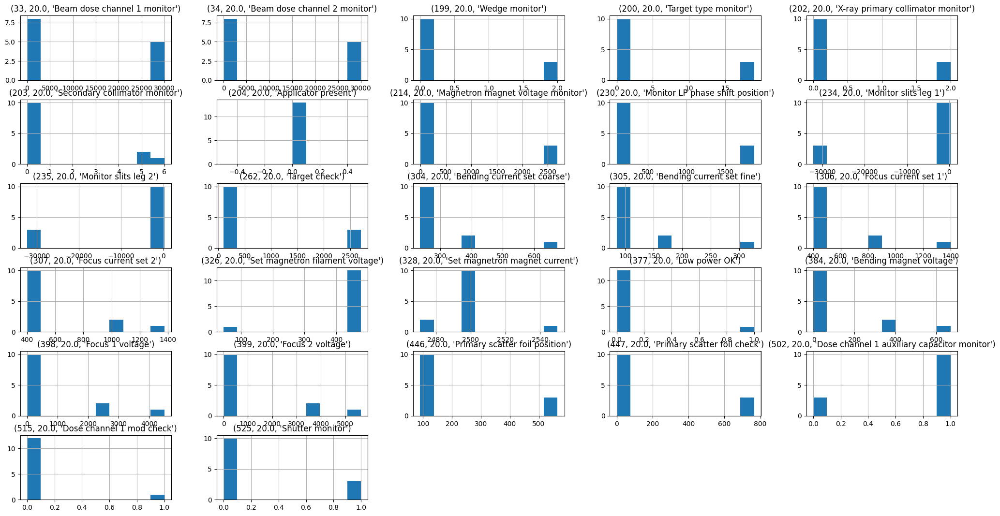

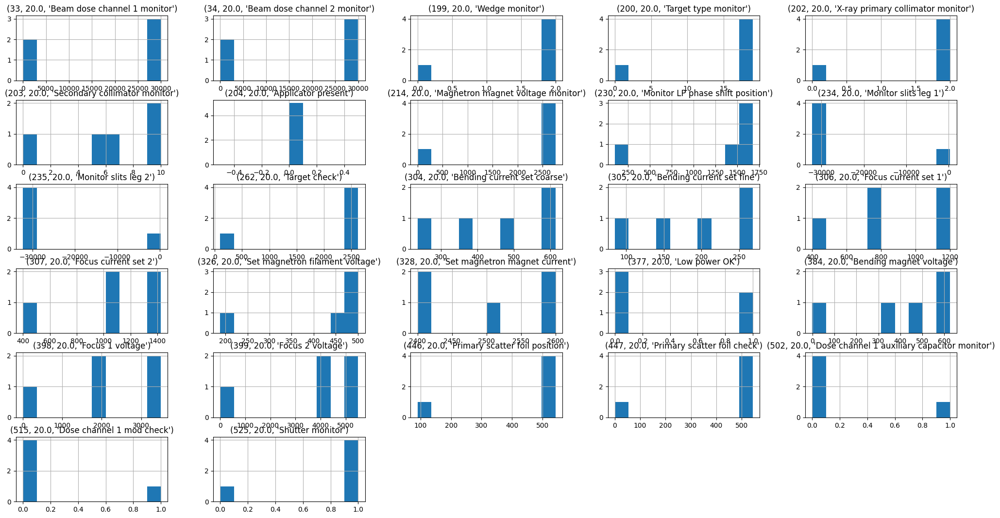

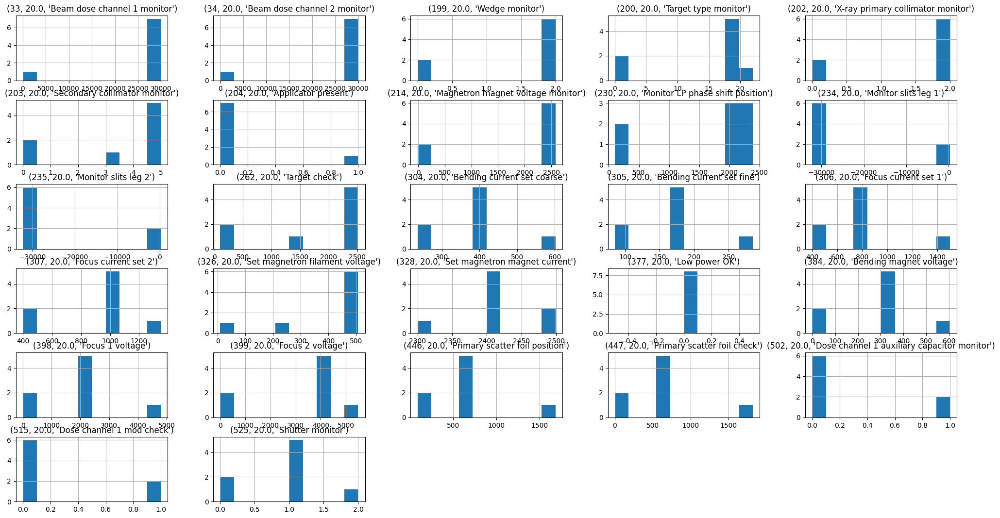

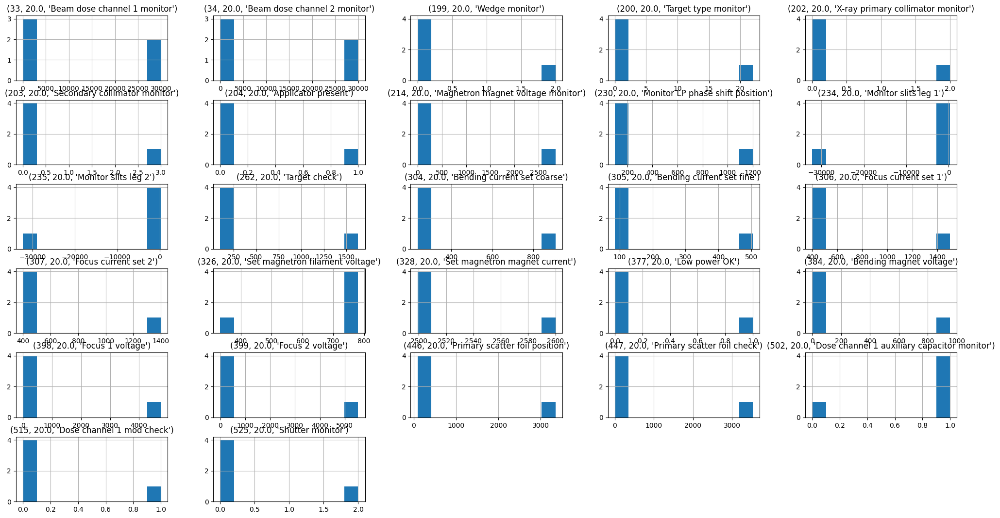

In [ ]:
changes_df = total_changes_df["Be6329"]
histograms = pd.DataFrame()

# for every linac the describe of the same data
for linac in list(set(changes_df["linac"])):
    print(linac)
    pivoted_be63 = changes_df[changes_df["linac"] == linac].pivot(index="date", columns=["item", "part", "category"], values="value")
    describing = pivoted_be63.describe()
    histograms = pd.concat([histograms, describing])
    pivoted_be63.hist(figsize=(25,13));

histograms.round(2)
   

In [ ]:
for x in range(len(histograms.columns)):  
    p_I = histograms.columns[x][:2]

    fig = px.line(be63_df[be63_df["Part&item"] == f"I:{p_I[0]} P:{p_I[1]}"], x="date", y ="value", color="linac", hover_data=["Part&item", "category"],markers=True, title=f"I:{p_I[0]} P:{p_I[1]}")
    fig.show()

Er was intresse naar de HT en LT hours,   
Item 275: Monitors the number of hours that the LT system has been powered with the machine in the Closed state or above.  
Item 276: Monitors the number of hours that the HT system has been powered with the machine in the Closed state or above.  

In [ ]:
l3 = be63_df[be63_df["linac"] == 2191]
px.line(be63_df[be63_df["item"].isin([275, 276]) ], x="date", y ="value", color="Part&item", hover_data=["Part&item", "category"],symbol="item",markers=True)


Maar er is geen verandering in dit item op 1 van de parts.

Verder correlatie tussen de bestanden.

In [ ]:
total_df = pd.concat(total_changes_df.values())

pivoted_be63 = total_df.pivot(index=["date", "linac"], columns=["item", "part", "category"], values="value").reset_index()

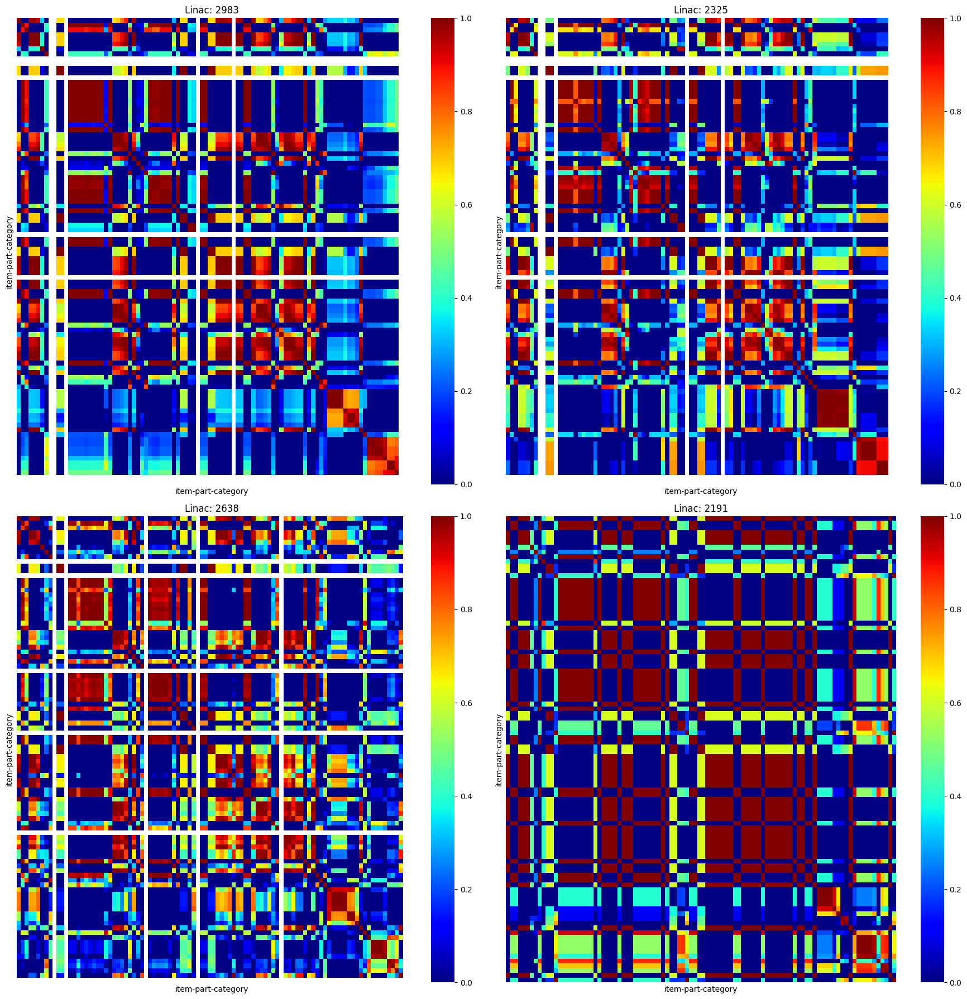

In [ ]:
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(18, 18))
linacs = list(set(pivoted_be63["linac"]))
corrs = []

for num in range(len(linacs)):
    row, col = divmod(num, 2)
    corr = pivoted_be63[pivoted_be63["linac"] == linacs[num]].set_index(["date", "linac"]).corr()
    corrs.append(corr)
    sns.heatmap(corr, cmap="jet", vmin=0.0, vmax=1.0, ax=axes[row, col], yticklabels=False, xticklabels=False  )
    axes[row, col].set_title(f"Linac: {linacs[num]}")
    axes[row, col].grid(True)

plt.tight_layout()
plt.show()



Tabel met de correlatie van alle linacs boven de 0.95

In [ ]:
results = pd.DataFrame()
linac = [2983, 2325, 2638, 2191 ]
num = -1

for df_corr in corrs:
    num += 1
    
    # Flatten MultiIndex to full "I:... P:..." labels for both rows and columns
    df_flat = df_corr.copy()
    df_flat.columns = df_flat.columns.map(lambda x: f"I:{x[0]} P:{x[1]}")
    df_flat.index = df_flat.index.map(lambda x: f"I:{x[0]} P:{x[1]}")

    # Stack and filter correlations
    df_result = (
        df_flat.stack()
        .reset_index()
        .rename(columns={"level_0": "row", "level_1": "col", 0: "correlation"})
        .query("correlation > 0.95 and correlation < 0.99999999")
    )

    # Add linac and deduplicate symmetrical pairs
    df_result["linac"] = linac[num]
    df_result["pair"] = df_result.apply(
        lambda x: tuple(sorted([x["row"], x["col"]])), axis=1
    )
    df_result = df_result.drop_duplicates(subset="pair").drop(columns="pair")

    results = pd.concat([results, df_result], ignore_index=True)

# Pivot to get correlation per linac for each unique pair
results.pivot(index=["row", "col"], values="correlation", columns="linac")
results[results["linac"] != 2325].pivot(index=["row", "col"], values="correlation", columns="linac")


linac                        2191      2638      2983
row           col                                    
I:124 P:142.0 I:161 P:142.0   NaN  0.971012  0.970773
              I:164 P:142.0   NaN  0.971012  0.970773
              I:166 P:142.0   NaN  0.989375       NaN
              I:199 P:20.0    NaN  0.971012  0.970773
              I:200 P:20.0    NaN       NaN  0.970773
...                           ...       ...       ...
I:447 P:19.0  I:502 P:20.0    NaN  0.959544       NaN
              I:525 P:19.0    NaN  0.994931       NaN
I:447 P:20.0  I:327 P:141.0   NaN  0.984910       NaN
              I:525 P:20.0    NaN  0.954826       NaN
I:525 P:19.0  I:44 P:141.0    NaN  0.997484       NaN

[407 rows x 3 columns]

In [ ]:
cols_been = []
for row in results["row"].unique():
    if row not in cols_been:
        cols = results[results["row"] == row]["col"].tolist()
        #om geen dubbele grafieken te krijgen
        cols_been.extend(cols)
        # moet in de grafiek komen
        cols.append(row)
        fig = px.line(be63_df[be63_df["Part&item"].isin(cols) ], x="date", y ="value", color="linac", hover_data=["Part&item", "category"],symbol = "Part&item",markers=True, title = row)
        fig.show() 

Verschillende items, die of exact het zelfde waarde hebben bij een part. Of de item heeft meerdere parts die op de zelfde manier veranderen. Maar ook de combinatie van beide.

Er was 1 opvallende trend aanwezig.

In [ ]:
results[results["row"] == "I:244 P:19.0"]

,row,col,correlation,linac


I 161: The magnetron tuner servo control item.
P 38: Coupled item

I 244: The value of this item is the HT current used by the magnetron filament rundown.
P 19: Calibration limit high 

In [ ]:
px.line(be63_df[be63_df["Part&item"].isin(["I:244 P:19.0", "I:161 P:38.0"]) ], x="date", y ="value", color="linac", hover_data=["Part&item", "category"],symbol = "Part&item",markers=True)

De item nummers zeggen wel beide iets over het magnetron. Maar de parts zeggen niet veel over elkaar.